In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import os
import numpy as np
import scanpy as sc
import PyWGCNA
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import mannwhitneyu, false_discovery_control
import re
from itertools import combinations
from scipy.stats import pearsonr
from matplotlib import patches
import ast

In [2]:
def stack_triangle(df, col):
    df = pd.DataFrame(
        df.where(
            np.tri(
                df.shape[0],
                dtype=bool,
                k=-1
            ),
            np.nan
        ).stack(dropna=True), columns=[col] 
    )
    
    return df


In [3]:
# Function that generates and saves the ROC curve
def generate_roc_curve(
    data,
    target_col,
    feature_col,
):
    # ROC curve using all gene pairs
    fpr, tpr, thr = roc_curve(data[target_col], data[feature_col])
    auroc = roc_auc_score(data[target_col], data[feature_col])
    
    return fpr, tpr, thr, auroc

In [4]:
def fig_to_panels(fig, axes, output_dir):
    # Save individual panels of a figure 
    
    for panel_name, ax in axes.items():
        # Extract the panel title
        panel_title = ax.get_title()

        # Sanitize the panel title to use in filenames
        safe_title = panel_title.replace(" ", "_").replace("/", "_").replace("\n", "_").lower()

        # Create the filename for the current panel
        output_file = os.path.join(output_dir,safe_title)

        # Adjust the bounding box to include everything (labels, titles, etc.)
        extent = ax.get_tightbbox(fig.canvas.get_renderer()).transformed(fig.dpi_scale_trans.inverted())

        # Save the individual panel using the adjusted bounding box
        fig.savefig(output_file + '.pdf', bbox_inches=extent, dpi=300)
        fig.savefig(output_file + '.png', bbox_inches=extent)

        print(f"Saved panel '{panel_title}' to {output_file}")


In [5]:
# Define colors
# Light version is obtained by setting alpha=0.5

ncolor  = '#00728eff' # solid dark
ncolor2 = '#00728e80' # alpha=0.5
lightncolor = '#7fb8c6ff' # solid light

tcolor  = '#ab3502ff'
tcolor2 = '#ab350280'
lighttcolor = '#d49980ff'

graycolor = '#4D4E4FFF'
graycolor2 ='#4d4e4f80'

lightgray = '#C8CAD4'

orangecolor = '#e69426'
orangecolor2 = '#e6942680'
lightorangecolor = '#f2c992ff'

In [6]:
def network_to_adj(network_path):
    network = pd.read_csv(
        network_path,
        usecols=['complex1', 'complex2', 'adj']
    )

    # Add a mirrored version of the network to make it symmetric
    network_mirrored = network.copy()
    network_mirrored.columns = ['complex2', 'complex1', 'adj']
    network = pd.concat([network, network_mirrored], ignore_index=True)

    adj = network.pivot(index='complex1', columns='complex2', values='adj').fillna(0)
    return adj

In [19]:
full = pd.read_csv('/home/lnemati/pathway_crosstalk/data/immunotherapy/full_dataset_with_clinical.csv')

In [7]:
tiger = pd.read_csv('/projects/bioinformatics/DB/tiger_immunotherapy/full_merged_dataset.csv', index_col=0)

In [8]:
braun = tiger[tiger['dataset_id'] == "Braun_2020"]

In [9]:
cliques_genes =  pd.read_csv('/home/lnemati/pathway_crosstalk/results/crosstalk/all_ccc_complex_pairs/adj/motifs/tumor/motifs.csv')
cliques_genes = cliques_genes.query('Type in ["3_clique", "4_clique"]')
cliques_genes = list(set(cliques_genes.Interaction.apply(lambda x: re.split('[+_&]', x)).sum()))

In [10]:
cols = braun.columns.intersection(cliques_genes)

In [11]:
braun[cols].isna().sum().sort_values()[::-1].head(10)

MRC1      311
CCL3      311
PECAM1    311
CCL5      311
ADORA3    311
CCL4      311
CCL18     311
ENTPD1      0
ESR1        0
F2RL2       0
dtype: int64

In [13]:
kidney = pd.read_csv('/home/lnemati/pathway_crosstalk/data/immunotherapy/tissues/kidney.csv', index_col=0)

In [19]:
cliques_genes =  pd.read_csv('/home/lnemati/pathway_crosstalk/results/crosstalk/all_ccc_complex_pairs/adj/motifs/tumor/motifs.csv')
cliques_genes = cliques_genes.query('Type in ["3_clique", "4_clique"]')
cliques_genes = list(set(cliques_genes.Interaction.apply(lambda x: re.split('[+_&]', x)).sum()))

In [22]:
cols = kidney.columns.intersection(cliques_genes)

In [23]:
kidney[cols].isna().sum().sort_values()[::-1].head(10)

PROCR       0
ENTPD1      0
ADGRE2      0
TNXB        0
HLA-DRA     0
IL15        0
ITGB2       0
TNC         0
SIRPB1      0
HLA-DQA2    0
dtype: int64

In [18]:
kidney['CCL5']

KeyError: 'CCL5'

In [15]:
kidney['CCL3']

KeyError: 'CCL3'

In [49]:
for (tissue, dataset), df in full.groupby(['tissue', 'dataset_id']):
    print(tissue, dataset)
    cols = df.columns[df.isna().sum() < 0.8*df.shape[0]]
    print(len(cliques_genes.intersection(cols)))

Adrenal gland tcga
283
Bladder imvigor210
278
Bladder tcga
283
Brain PRJNA482620
283
Brain tcga
283
Breast tcga
283
Colon tcga
283
Head and Neck region tcga
283
Kidney Braun_2020
276
Kidney imvigor210
278
Kidney tcga
283
Liver imvigor210
278
Lung GSE126044
277
Lung GSE135222
277
Lung imvigor210
278
Lung tcga
283
Lymphatic tissue imvigor210
278
Skin GSE100797
278
Skin GSE115821
283
Skin GSE145996
277
Skin GSE78220
283
Skin GSE91061
283
Skin PRJEB23709
283
Skin phs000452
283
Skin tcga
283
Soft tissue,Bone tcga
283
Stomach PRJEB25780
283
Ureter imvigor210
278
Uterus tcga
283


In [18]:
full.dataset_id.value_counts()

dataset_id
imvigor210     298
Braun_2020     281
phs000452      153
GSE91061        98
PRJEB23709      91
tcga            89
PRJEB25780      78
PRJNA482620     34
GSE115821       33
GSE78220        28
GSE135222       27
GSE100797       25
GSE126044        7
GSE145996        4
Name: count, dtype: int64

In [17]:
full

,Unnamed: 0,patient_name,dataset_id,dataset_group,Treatment,response,response_NR,M Stage,overall survival (days),vital status,...,KIAA0226,VPRBP,FAM115A,CD97,KIAA0247,KIAA0195,NUPL1,TOMM70A,LPPR4,KIAA0020
0,SRR7344544,GSE115821-115-031814,GSE115821,Melanoma_GSE115821,PRE,N,N,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,SRR7344545,GSE115821-115-041514,GSE115821,Melanoma_GSE115821,ON,N,N,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,SRR7344546,GSE115821-148-6-5-14_S9,GSE115821,Melanoma_GSE115821,PRE,R,R,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,SRR7344547,GSE115821-208-10-22-14_S12,GSE115821,Melanoma_GSE115821,ON,N,N,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SRR7344549,GSE115821-208-5-13-15_S14,GSE115821,Melanoma_GSE115821,ON,N,N,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1241,SAM5cfa1699bdb7,imvigor210-SAM5cfa1699bdb7,imvigor210,NaN,NaN,NaN,N,NaN,NaN,NaN,...,6.735097,5.385146,6.823911,9.179382,8.868735,8.511500,7.601043,8.850161,7.326051,10.039426
1242,SAMda4d892fddc8,imvigor210-SAMda4d892fddc8,imvigor210,NaN,NaN,NaN,N,NaN,NaN,NaN,...,6.538560,5.163256,5.648949,8.031032,7.724980,7.467304,6.467276,8.012758,7.286523,8.697871
1243,SAM3a1c9632ff7b,imvigor210-SAM3a1c9632ff7b,imvigor210,NaN,NaN,NaN,N,NaN,NaN,NaN,...,6.766509,5.332945,6.769075,7.741720,7.192109,8.873762,8.030008,9.063121,7.438525,7.696354
1244,SAM8b4b8b0f9e73,imvigor210-SAM8b4b8b0f9e73,imvigor210,NaN,NaN,NaN,N,NaN,NaN,NaN,...,6.592140,5.272996,6.288536,8.731069,8.046907,7.314114,7.233545,8.685920,10.868133,9.006051


# Immunotherapy Prediction

In [30]:
## Read the results
cohorts_dir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/features_sets/tissues'

dfs = []

for cohort in os.listdir(cohorts_dir):
    path = os.path.join(cohorts_dir, cohort, 'metrics')
    for file in os.listdir(path):
        df = pd.read_csv(os.path.join(path, file))
        df.columns = ['type'] + list(df.columns[1:])
        df['cohort'] = cohort
        
        probs_path = os.path.join(cohorts_dir, cohort, 'prediction_probabilities')
        probs = pd.read_csv(os.path.join(probs_path, 'whole_transcriptome.csv'), index_col=0)
        df['n_patients'] = probs.shape[1]
        
        dfs.append(df)
        
df = pd.concat(dfs, ignore_index=True)

In [31]:
import os
import pandas as pd
from sklearn.metrics import roc_curve, precision_recall_curve, roc_auc_score, average_precision_score

cohorts_dir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/features_sets/tissues'

roc_curves = {}
pr_curves = {}

for cohort in os.listdir(cohorts_dir):
    path = os.path.join(cohorts_dir, cohort, 'prediction_probabilities')
    
    roc_curves[cohort] = {}
    pr_curves[cohort] = {}

    for file in os.listdir(path):
        ftype = file.replace('.csv', '')
        roc_curves[cohort][ftype] = {}
        pr_curves[cohort][ftype] = {}

        tmp = pd.read_csv(os.path.join(path, file), index_col=0)

        # Convert true labels to binary (1 for 'R', 0 for 'N')
        y_true = tmp.iloc[0].map({'R': 1, 'N': 0}).values  
        y_score = tmp.iloc[1].astype(float).values  # Ensure probabilities are floats

        # Compute ROC Curve
        fpr, tpr, roc_thresholds = roc_curve(y_true, y_score)
        roc_curves[cohort][ftype]['fpr'] = fpr
        roc_curves[cohort][ftype]['tpr'] = tpr
        roc_curves[cohort][ftype]['thresholds'] = roc_thresholds
        roc_curves[cohort][ftype]['auc'] = roc_auc_score(y_true, y_score)

        # Compute Precision-Recall Curve
        precision, recall, pr_thresholds = precision_recall_curve(y_true, y_score)
        pr_curves[cohort][ftype]['precision'] = precision
        pr_curves[cohort][ftype]['recall'] = recall
        pr_curves[cohort][ftype]['thresholds'] = pr_thresholds
        pr_curves[cohort][ftype]['auprc'] = average_precision_score(y_true, y_score)


In [32]:
order_labels_dict = {
    'cd274': 'CD274',
    'tls-melanoma': 'TLS-Melanoma',
    'caf_pca': 'CAF (PCA)',
    't_cell_dysfunction_pca': 'T Cell Dysfunction (PCA)',
    'mdsc_pca': 'MDSC (PCA)',
    'ifng': 'IFNG',
    'tam_m2_pca': 'TAM M2 (PCA)',
    'cd8': 'CD8',
    'whole_transcriptome': 'All Genes (PCA)',
    't_cell_exclusion_pca': 'T Cell Exclusion (PCA)',
    'all_ccis': 'All CCIs (PCA)',
    #'all_signatures': 'All Signatures',
    'tls': 'TLS',
    't_cell-inflamed_gep': 'T Cell-Inflamed GEP',
    #'all_motifs': 'All Motifs',
    'all_cliques': 'Cliques'
}

order = []
labels = []

baseline = df.query('type == "whole_transcriptome" and cohort != "full_dataset"')['auroc'].mean()

for idx in df.groupby('type')['auroc'].mean().sort_values().index:
    if df.query('type == @idx and cohort != "full_dataset"')['auroc'].mean() >= baseline:
        if idx in order_labels_dict.keys():
            order.append(idx)
            labels.append(order_labels_dict[idx])

#for idx in df.query('cohort != "full_dataset"').groupby('type')['auroc'].median().sort_values().index:
#    if idx in order_labels_dict.keys():
#        order.append(idx)
#        labels.append(order_labels_dict[idx])

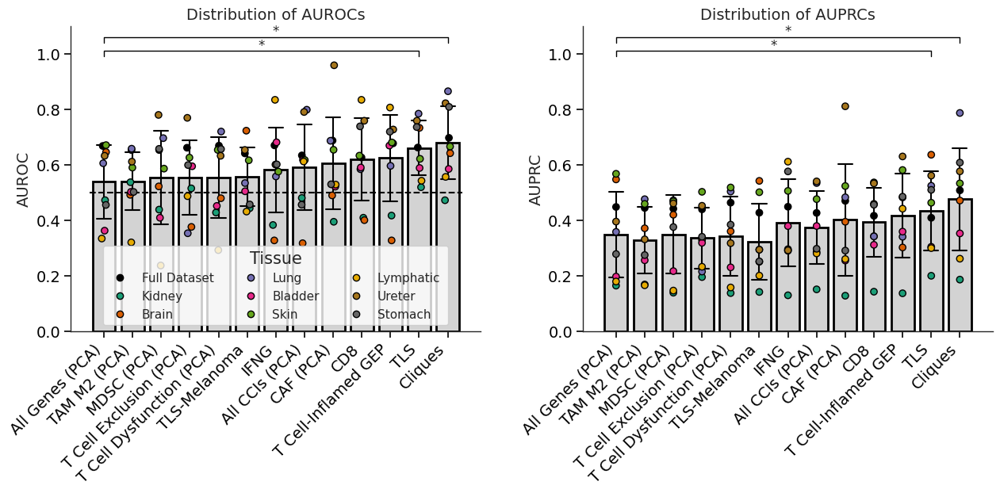

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import wilcoxon

fs = 14  # Font size
smallfs = 11

# Compute differences
def compute_differences(df):
    df = df.copy()
    whole_transcriptome_values = df[df["type"] == "whole_transcriptome"].set_index("cohort")["auroc"]
    df["auroc_diff"] = df.apply(lambda row: row["auroc"] - whole_transcriptome_values[row["cohort"]], axis=1)
    whole_transcriptome_values = df[df["type"] == "whole_transcriptome"].set_index("cohort")["auprc"]
    df["auprc_diff"] = df.apply(lambda row: row["auprc"] - whole_transcriptome_values[row["cohort"]], axis=1)
    return df

df_diff = compute_differences(df)

# Setup figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
plt.subplots_adjust(wspace=0.25)

# Get unique cohorts excluding full_dataset
cohorts = [c for c in df_diff.cohort.unique() if c != "full_dataset"]
colors = sns.color_palette("Dark2", len(cohorts))
cohort_colors = dict(zip(cohorts, colors))
cohort_colors['full_dataset'] = 'black'

# AUROC subplot (Left)
ax1 = axes[0]
#sns.boxplot(df.query('cohort != "full_dataset"'), x='type', y='auroc', color='lightgray', boxprops={"alpha": 0.7}, ax=ax1, order=order)

sns.barplot(
    data=df,
    x='type',
    y='auroc',
    estimator='mean',
    ci='sd',
    color='lightgray',
    ax=ax1,
    order=order,
    errcolor='black',
    errwidth=1.5,
    capsize=0.5,
    lw=2,
    edgecolor='k',
)
sns.stripplot(df, x='type', y='auroc', hue='cohort', palette=cohort_colors, jitter=True, size=6, edgecolor="black", linewidth=1., ax=ax1, order=order)

ax1.hlines(0.5, *ax1.get_xlim(), color='k', linestyle='--')
#ax1.set_title("AUROC", fontsize=fs)
ax1.set_xlabel("Features Set", fontsize=fs)
ax1.set_ylabel("AUROC", fontsize=fs)
ax1.set_title('Distribution of AUROCs', fontsize=fs)


# AUPRC subplot (Right)
ax2 = axes[1]
#sns.boxplot(df.query('cohort != "full_dataset"'), x='type', y='auprc', color='lightgray', boxprops={"alpha": 0.7}, ax=ax2, order=order)

sns.barplot(
    data=df,
    x='type',
    y='auprc',
    estimator='mean',
    ci='sd',
    color='lightgray',
    ax=ax2,
    order=order,
    errcolor='black',
    errwidth=1.5,
    capsize=0.5,
    lw=2,
    edgecolor='k',
)
sns.stripplot(df, x='type', y='auprc', hue='cohort', palette=cohort_colors, jitter=False, size=6, edgecolor="black", linewidth=1., ax=ax2, order=order)

#ax2.set_title("AUPRC", fontsize=fs)
ax2.set_xlabel("Features Set", fontsize=fs)
ax2.set_ylabel("AUPRC", fontsize=fs)
ax2.set_title('Distribution of AUPRCs', fontsize=fs)

ax2.get_legend().remove()

#fig.suptitle('Distribution of AUROCs and AUPRCs Across Features Sets', fontsize=fs, )

# Compute p-values for AUROC and AUPRC separately
p_values_auroc = []
p_values_auprc = []
comparisons = []
reference_group = "whole_transcriptome"

for group in order:
    if group == reference_group:
        continue
    stat_auroc, p_auroc = wilcoxon(df_diff.query(f'type == "{group}"')["auroc_diff"], alternative='greater')
    stat_auprc, p_auprc = wilcoxon(df_diff.query(f'type == "{group}"')["auprc_diff"], alternative='greater')
    
    if p_auroc < 0.05 or p_auprc < 0.05:
        p_values_auroc.append(p_auroc)
        p_values_auprc.append(p_auprc)
        comparisons.append(group)

# Function to convert p-values to significance stars
def get_significance_label(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "ns"

pval_labels_auroc = {group: get_significance_label(p) for group, p in zip(comparisons, p_values_auroc)}
pval_labels_auprc = {group: get_significance_label(p) for group, p in zip(comparisons, p_values_auprc)}

ax1.set_ylim(bottom=0, top=1.1)
ax2.set_ylim(bottom=0, top=1.1)
ax1.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1])
ax2.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1])

# Function to add significance bars
def add_significance_bars(ax, pval_labels, comparisons, y_offset=0.05, text_offset=0.02):
    y_max = 0.9*ax.get_ylim()[1]
    bar_height = (y_max - ax.get_ylim()[0]) * 0.02
    
    for i, group in enumerate(comparisons):
        sig_label = pval_labels[group]
        x1, x2 = order.index(reference_group), order.index(group)
        y = y_max + (2.5 * i * bar_height)

        ax.plot([x1, x1, x2, x2], [y, y + bar_height, y + bar_height, y], lw=1, linestyle='-', color="black")
        ax.text(0.5 * (x1 + x2), y + 1.3 * bar_height, sig_label, ha='center', fontsize=12)

# Add significance bars
add_significance_bars(ax1, pval_labels_auroc, comparisons)
add_significance_bars(ax2, pval_labels_auprc, comparisons)

# Adjust x-labels
for ax in axes:
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.set_xlabel('')
    ax.tick_params(labelsize=fs)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

handles, legend_labels = ax1.get_legend_handles_labels()
ax1.legend(
    handles,
    [label.title().replace('_', ' ').replace('Tissue', '') for label in legend_labels],
    title="Tissue",
    ncol=3,
    fontsize=smallfs,
    loc='lower center'
)

for ax in (ax1, ax2):
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(True)
    
    ax.tick_params(
        axis='both',
        which='both',
        labelsize=fs,
        direction='out',
        length=6,
        width=1.2,
        colors='black'
    )
    
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/auroc_auprc.pdf', bbox_inches='tight', dpi=300)
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/auroc_auprc.png', bbox_inches='tight', dpi=300)

plt.show()

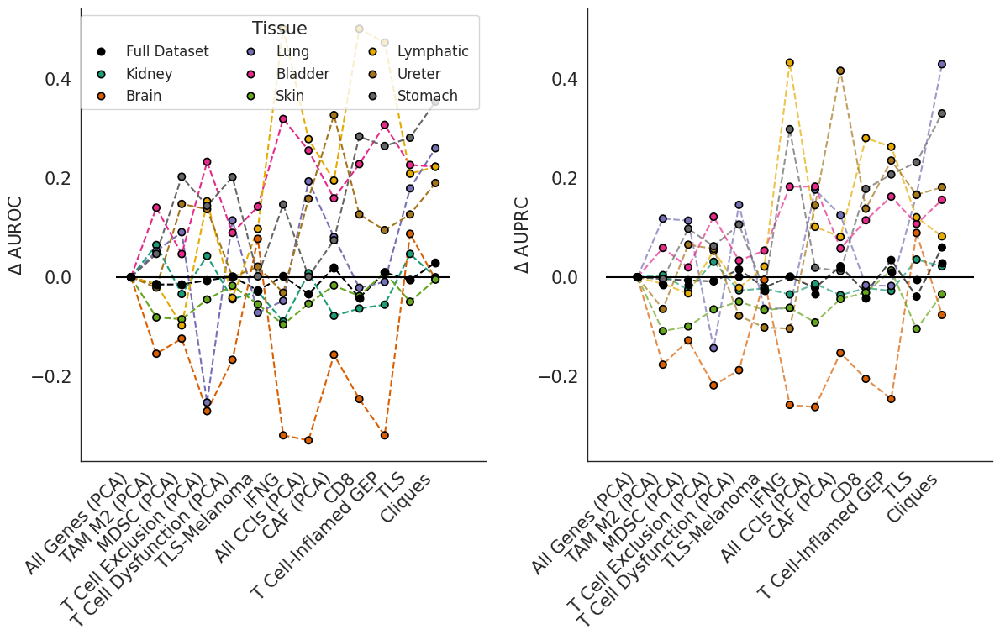

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Setup figure with only two subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 7), sharex=True)
plt.subplots_adjust(wspace=0.25)
fs = 15  # Font size

ax3, ax4 = axes  # Assign the two axes

# AUROC Difference subplot (Left)
sns.stripplot(df_diff, x='type', y='auroc_diff', hue=df_diff['cohort'], palette=cohort_colors, 
              jitter=False, size=6, edgecolor="black", linewidth=1.2, ax=ax3, order=order)
sns.stripplot(df_diff.query('cohort == "full_dataset"'), x='type', y='auroc_diff', color='black', 
              jitter=False, size=6, edgecolor="black", linewidth=1.2, ax=ax3, order=order)

for cohort in df_diff.cohort.unique():
    ax3.plot(df_diff.query('cohort == @cohort').set_index('type').reindex(order)['auroc_diff'], 
             color=cohort_colors.get(cohort, 'black'), linestyle='--')

ax3.hlines(0, *ax3.get_xlim(), color='k', linestyle='-')
ax3.set_ylabel(r"$\Delta$ AUROC", fontsize=fs)

# AUPRC Difference subplot (Right)
sns.stripplot(df_diff, x='type', y='auprc_diff', hue=df_diff['cohort'], palette=cohort_colors, 
              jitter=False, size=6, edgecolor="black", linewidth=1.2, ax=ax4, order=order)
sns.stripplot(df_diff.query('cohort == "full_dataset"'), x='type', y='auroc_diff', color='black', 
              jitter=False, size=6, edgecolor="black", linewidth=1.2, ax=ax4, order=order)

for cohort in df_diff.cohort.unique():
    ax4.plot(df_diff.query('cohort == @cohort').set_index('type').reindex(order)['auprc_diff'], 
             color=cohort_colors.get(cohort, 'black'), alpha=0.7, linestyle='--')

ax4.hlines(0, *ax4.get_xlim(), color='k', linestyle='-')
ax4.set_ylabel(r"$\Delta$ AUPRC", fontsize=fs)

# Adjust x-labels
for ax in axes:
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.set_xlabel('')
    ax.tick_params(labelsize=fs)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Make y-limits consistent for difference plots
min_ylim = min(ax3.get_ylim()[0], ax4.get_ylim()[0])
max_ylim = max(ax3.get_ylim()[1], ax4.get_ylim()[1])
ax3.set_ylim(min_ylim, max_ylim)
ax4.set_ylim(min_ylim, max_ylim)

ax4.get_legend().remove()

handles, legend_labels = ax3.get_legend_handles_labels()
ax3.legend(handles, [label.title().replace('_', ' ').replace('Tissue', '') for label in legend_labels], title="Tissue", ncol=3, fontsize=12)

#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/tissue_difference_auroc_auprc.pdf', bbox_inches='tight', dpi=300)
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/tissue_difference_auroc_auprc.png', bbox_inches='tight', dpi=300)

plt.show()


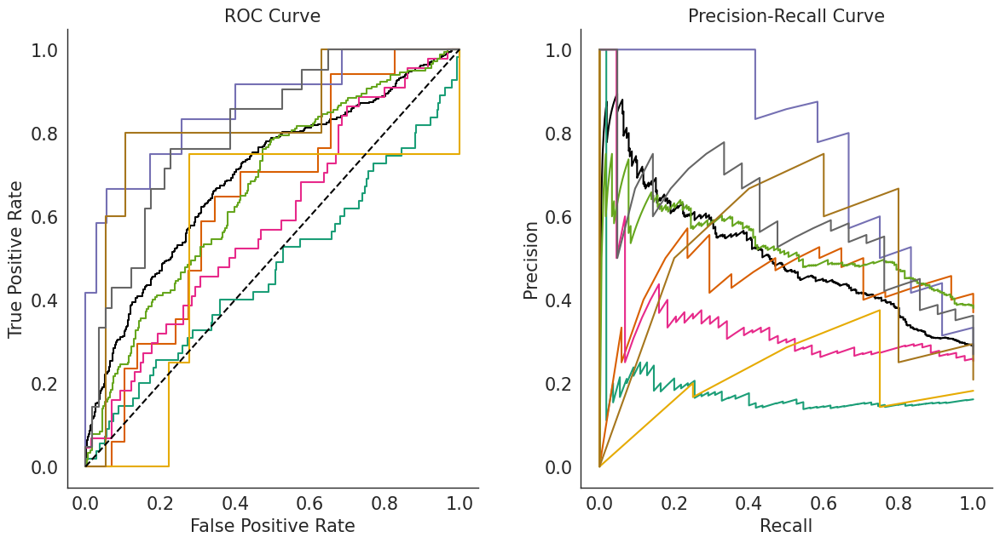

In [14]:
## Create the figure with two subplots (1 row, 2 columns)
fig, (ax5, ax6) = plt.subplots(1, 2, figsize=(14, 7))
plt.subplots_adjust(wspace=0.25, hspace=0.1)

ftype = 'all_cliques'

# ROC Curves - ax5
for cohort in roc_curves:
    fpr = roc_curves[cohort][ftype]['fpr']
    tpr = roc_curves[cohort][ftype]['tpr']
    auc = roc_curves[cohort][ftype]['auc']
    ax5.plot(fpr, tpr, color=cohort_colors.get(cohort))

# Set title and labels
ax5.set_title("ROC Curve", fontsize=fs)
ax5.set_xlabel("False Positive Rate", fontsize=fs)
ax5.set_ylabel("True Positive Rate", fontsize=fs)
ax5.plot([0, 1], [0, 1], color='k', linestyle="--", label="Random")  # Adding the random line
ax5.legend(fontsize=fs)

# Precision-Recall Curves - ax6
for cohort in pr_curves:
    precision = pr_curves[cohort][ftype]['precision']
    recall = pr_curves[cohort][ftype]['recall']
    auprc = pr_curves[cohort][ftype]['auprc']
    ax6.plot(recall, precision, label=f"{cohort} (AUPRC={auprc:.2f})", color=cohort_colors.get(cohort))

# Set title and labels
ax6.set_title("Precision-Recall Curve", fontsize=fs)
ax6.set_xlabel("Recall", fontsize=fs)
ax6.set_ylabel("Precision", fontsize=fs)
ax6.legend(fontsize=fs, loc="lower left")

# Make both axes share the same font size for ticks
for ax in [ax5, ax6]:
    ax.tick_params(axis='both', labelsize=fs)
    ax.spines['top'].set_visible(False)  # Hide top spine
    ax.spines['right'].set_visible(False)  # Hide right spine
    ax.get_legend().remove()

# Optionally, save the plot
# plt.savefig('roc_pr_curves.png', bbox_inches='tight', dpi=300)
plt.show()


In [34]:
## Read the results
parentdir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/individual_interactions_and_motifs'

dfs = []

for tissue in os.listdir(parentdir):
    #if tissue in ['full_dataset']: # add back lymph and ureter when they finish running
    #    continue
    path = os.path.join(parentdir, tissue, 'aggregated', 'aggregated.csv')
    tissuedf = pd.read_csv(os.path.join(path))
    tissuedf = tissuedf.rename(columns={'Unnamed: 0': 'interaction'})
    #tissuedf['motif'] = tissuedf['motif'].replace({'3_clique': 'cliques', '4_clique': 'cliques'})

    dfs.append(tissuedf)
        
crosstalkdf = pd.concat(dfs, ignore_index=True)

In [41]:
crosstalkdf.query('motif in ["3_clique", "4_clique"]').dropna().groupby('tissue').count()

,interaction,auroc,auroc1,auroc2,auprc,auprc1,auprc2,auroc_diff,auprc_diff,motif
tissue,,,,,,,,,,
bladder,4115,4115,4115,4115,4115,4115,4115,4115,4115,4115
brain,4305,4305,4305,4305,4305,4305,4305,4305,4305,4305
full_dataset,3932,3932,3932,3932,3932,3932,3932,3932,3932,3932
kidney,3584,3584,3584,3584,3584,3584,3584,3584,3584,3584
lung,4077,4077,4077,4077,4077,4077,4077,4077,4077,4077
lymphatic_tissue,4077,4077,4077,4077,4077,4077,4077,4077,4077,4077
skin,4305,4305,4305,4305,4305,4305,4305,4305,4305,4305
stomach,4305,4305,4305,4305,4305,4305,4305,4305,4305,4305
ureter,4077,4077,4077,4077,4077,4077,4077,4077,4077,4077


In [71]:
## Read the results
parentdir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/individual_interactions_and_motifs'

dfs = []

for tissue in os.listdir(parentdir):
    #if tissue in ['full_dataset']: # add back lymph and ureter when they finish running
    #    continue
    path = os.path.join(parentdir, tissue, 'aggregated', 'aggregated.csv')
    tissuedf = pd.read_csv(os.path.join(path))
    tissuedf = tissuedf.rename(columns={'Unnamed: 0': 'interaction'})
    #tissuedf['motif'] = tissuedf['motif'].replace({'3_clique': 'cliques', '4_clique': 'cliques'})

    dfs.append(tissuedf)
        
crosstalkdf = pd.concat(dfs, ignore_index=True)
crosstalkdf = crosstalkdf.dropna()

crosstalkdf = crosstalkdf.sort_values(by='auroc')[::-1]

crosstalkdf = crosstalkdf.query('motif != "random_pairs"')
#crosstalkdf = crosstalkdf.query('tissue != "full_dataset"')

better = crosstalkdf.query('auroc > auroc1 and auroc > auroc2')
better = better.query('auprc > auprc1 and auprc > auprc2')

In [72]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/results/crosstalk/all_ccc_complex_pairs/adj/motifs/tumor/motifs_permutations.csv')
motifs = pd.read_csv('/home/lnemati/pathway_crosstalk/results/crosstalk/all_ccc_complex_pairs/adj/motifs/tumor/counts.csv', index_col='motif')
motifs = motifs['number'] 

df3 = df[[col for col in df.columns if col.startswith('3')]]
df4 = df[[col for col in df.columns if col.startswith('4')]]
motifs3 = motifs.loc[[idx for idx in motifs.index if idx.startswith('3')]]
motifs4 = motifs.loc[[idx for idx in motifs.index if idx.startswith('4')]]

motifs3 = motifs3 / motifs3.sum()
motifs4 = motifs4 / motifs4.sum()
df3 = (df3.T / df3.sum(1)).T
df4 = (df4.T / df4.sum(1)).T

df = df3.join(df4)
motifs = pd.concat([motifs3, motifs4])

means = df.mean()
stds = df.std()

motifs_z = ((motifs - means) / stds).sort_values()
motifs_z.name = 'z'

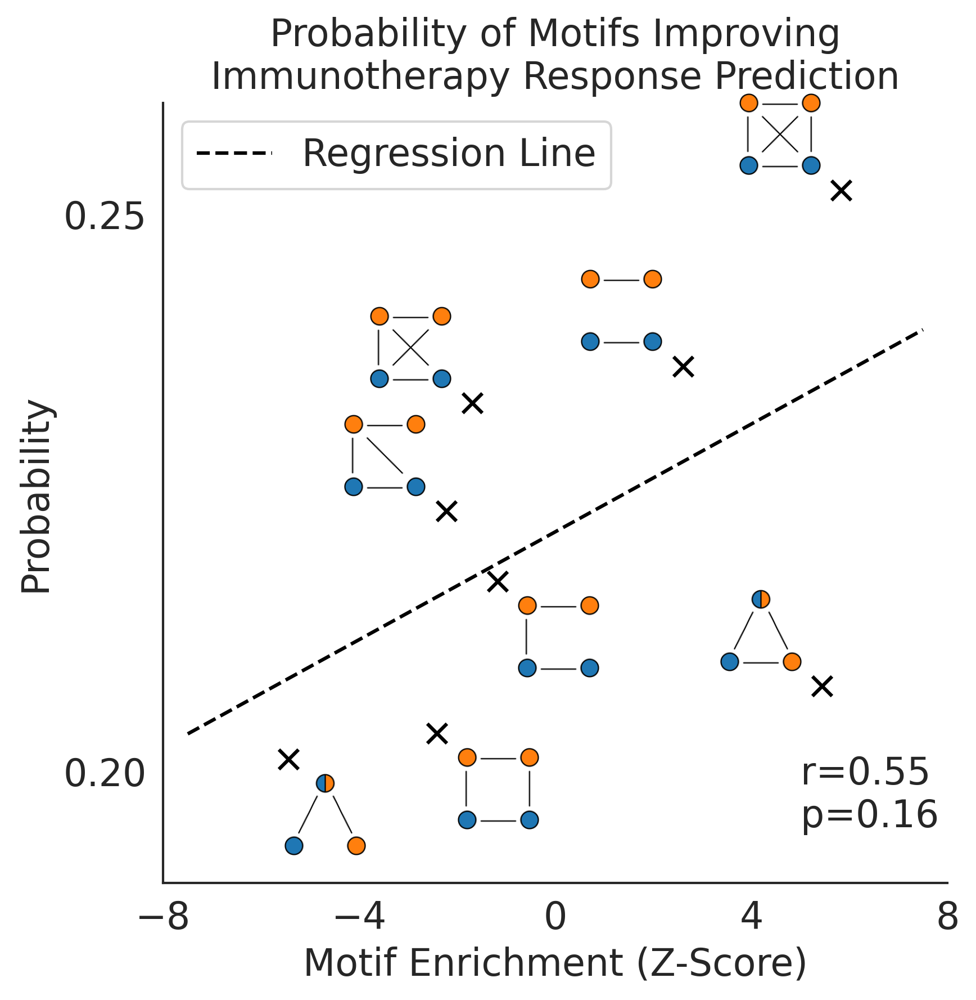

In [73]:
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib import image as mpimg
import os
from PIL import Image

# Constants
dpi = 300
img_dir = '/home/lnemati/pathway_crosstalk/data/motifs_icons/'  # Update this path
image_scaling_factor = 0.25  # Adjust this factor to scale image size (smaller = more zoomed out)
x_offset = -1.25
y_offset = 0.005

fs = 16

# Filter data
#all_counts = crosstalkdf.query('tissue != "full_dataset"').motif.value_counts().sort_values(ascending=False)

probs = (better.query('tissue != "full_dataset"').motif.value_counts() / crosstalkdf.query('tissue != "full_dataset"').motif.value_counts()).sort_values()
probs = probs.loc[motifs_z.index]

data = pd.DataFrame()
data['z'] = motifs_z
data['prob'] = probs

# Calculate Pearson correlation
r_value, p_value = pearsonr(probs, motifs_z)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=dpi)

# Plot the scatter points
#ax.scatter(
#    data['z'], 
#    data['prob'], 
#    color=lightgray, 
#    marker='s', 
#    edgecolors='black',  # Black edge color
#    s=70,
#    linewidths=1.5  # Thickness of the edge
#)
ax.scatter(
    data['z'], 
    data['prob'], 
    #color='black', 
    color='black', 
    marker='x', 
    edgecolors='black',  # Black edge color
    s=70,
    linewidths=1.5  # Thickness of the edge
)

# Add Pearson correlation to plot
ax.text(5, 0.195, 'r={:.2f}\np={:.2f}'.format(r_value, p_value), fontsize=fs)

# Set limits and ticks
ax.set_xlim(-8, 8)
ax.set_ylim(0.19, 0.26)
xticks = [-8, -4, 0, 4, 8]
yticks = [0.2, 0.25]
ax.set_xticks(xticks)
ax.set_yticks(yticks)

# Hide top and right spines
ax.spines[['right', 'top']].set_visible(False)
ax.tick_params(labelsize=fs)

# Add title and labels
ax.set_title('Probability of Motifs Improving\nImmunotherapy Response Prediction', fontsize=fs)
ax.set_xlabel('Motif Enrichment (Z-Score)', fontsize=fs)
ax.set_ylabel('Probability', fontsize=fs)

# Make the background of the plot transparent so the images can show up
ax.patch.set_alpha(0)

# Get the regression line parameters (slope and intercept)
slope, intercept = np.polyfit(data['z'], data['prob'], 1)

# Extend the regression line beyond the data range
x_extended = np.linspace(ax.get_xlim()[0] + 0.5, ax.get_xlim()[1] - 0.5, 100)
y_extended = slope * x_extended + intercept
ax.plot(x_extended, y_extended, linestyle='--', color='k', linewidth=1.5, label='Regression Line', zorder=-10)

# Dictionary to define manual positions for each motif
motif_positions = {
    '3_path': (data['z']['3_path']+2, data['prob']['3_path']-0.01),
    '4_cycle': (data['z']['4_cycle']+2.5, data['prob']['4_cycle']-0.01),
    '4_triangle_extra': (data['z']['4_triangle_extra'], data['prob']['4_triangle_extra']),
    '4_one_missing': (data['z']['4_one_missing'], data['prob']['4_one_missing']),
    '4_path': (data['z']['4_path']+2.5, data['prob']['4_path']-0.01),
    '4_no_crosstalk': (data['z']['4_no_crosstalk'], data['prob']['4_no_crosstalk']),
    '3_clique': (data['z']['3_clique'], data['prob']['3_clique']),
    '4_clique': (data['z']['4_clique'], data['prob']['4_clique']),
}

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

for motif, (x_pos, y_pos) in motif_positions.items():
    img_path = os.path.join(img_dir, f"{motif}.png")
    if os.path.exists(img_path):
        im = Image.open(img_path)
        im = im.resize((int(im.width * image_scaling_factor), int(im.height * image_scaling_factor)))
        imagebox = OffsetImage(im, zoom=image_scaling_factor, resample=True)
        ab = AnnotationBbox(imagebox, (x_pos + x_offset, y_pos + y_offset), frameon=False)
        ax.add_artist(ab)


# Hide legend, as it may conflict with the images
#plt.legend([], [], frameon=False)
plt.legend(fontsize=fs, loc='upper left')

#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/motifs_z_prob.pdf', bbox_inches='tight', dpi=dpi)
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/motifs_z_prob.png', bbox_inches='tight', dpi=dpi)

# Show the plot
plt.show()


In [66]:
from scipy.stats import spearmanr

In [67]:
spearmanr(motifs_z, probs)

SignificanceResult(statistic=0.6904761904761906, pvalue=0.057990318164572716)

In [19]:
#crosstalkdf.to_csv('/home/lnemati/pathway_crosstalk/results/immunotherapy/aggregated/cliques_and_random_pairs.csv')
#crosstalkdf.query('motif == "cliques"').to_csv('/home/lnemati/pathway_crosstalk/results/immunotherapy/aggregated/cliques.csv')

In [20]:
## Read the results
parentdir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/individual_interactions_and_motifs'

dfs = []

for tissue in os.listdir(parentdir):
    #if tissue in ['full_dataset']: # add back lymph and ureter when they finish running
    #    continue
    path = os.path.join(parentdir, tissue, 'aggregated', 'aggregated.csv')
    tissuedf = pd.read_csv(os.path.join(path))
    tissuedf = tissuedf.rename(columns={'Unnamed: 0': 'interaction'})
    #tissuedf['motif'] = tissuedf['motif'].replace({'3_clique': 'cliques', '4_clique': 'cliques'})

    dfs.append(tissuedf)
        
crosstalkdf = pd.concat(dfs, ignore_index=True)
crosstalkdf = crosstalkdf.dropna()

crosstalkdf = crosstalkdf.sort_values(by='auroc')[::-1]

#crosstalkdf = crosstalkdf.query('motif != "random_pairs"')
crosstalkdf = crosstalkdf.query('tissue != "full_dataset"')

better = crosstalkdf.query('auroc > auroc1 and auroc > auroc2')
better = better.query('auprc > auprc1 and auprc > auprc2')

In [21]:
# Assuming df is your dataframe
df_mean = crosstalkdf.groupby("interaction")[["auroc", "auroc_diff", "auprc", "auprc_diff"]].median().reset_index()
df_mean = df_mean.sort_values(by='auroc')[::-1]
df_mean.columns = ["interaction", "mean_auroc", "mean_auroc_diff", "mean_auprc", "mean_auprc_diff"]
# Create a mapping from interaction to motif
interaction_to_motif = crosstalkdf.drop_duplicates("interaction")[["interaction", "motif"]]

# Merge the motif info back to df_mean
df_mean = df_mean.merge(interaction_to_motif, on="interaction", how="left")

#df_mean.to_csv('/home/lnemati/pathway_crosstalk/results/immunotherapy/aggregated/cliques_medians.csv')

In [22]:
df_mean = df_mean.sort_values(by='mean_auroc')[::-1]
df_mean

,interaction,mean_auroc,mean_auroc_diff,mean_auprc,mean_auprc_diff,motif
0,HLA-F+KIR3DS1&GDF15+TGFBR2,0.819444,-0.010526,0.415476,-0.024738,random_pairs
1,CD4+HLA-DQB1&ACKR1+CCL5,0.736842,0.009190,0.428187,0.039016,4_clique
2,B4GALT3+P2RY14&CCL3L1+ACKR2,0.736111,0.000000,0.494298,0.000000,random_pairs
3,ACKR1+CXCL13&ACKR1+CCL5,0.732665,-0.009091,0.427959,-0.005230,3_clique
4,ACKR1+CXCL9&CD69+KLRB1,0.730828,-0.002041,0.452433,0.009255,4_clique
...,...,...,...,...,...,...
14701,WNT10A+FZD8_LRP5&WNT3+FZD1_LRP5,0.379017,-0.041249,0.211910,-0.023634,random_pairs
14702,ITGA2_ITGB1+LAMA5&DAG1+LAMA5,0.378565,-0.094448,0.228983,-0.037806,3_clique
14703,TGM2+ADGRG1&FGF5+FGFR2,0.366370,-0.102196,0.239037,-0.038850,random_pairs
14704,DDC+HTR7&GAD2_SLC6A13+GABRA1_GABRB2,0.358831,-0.087774,0.260632,-0.053538,random_pairs


In [23]:
crosstalkdf['motif'] = crosstalkdf.motif.replace({
    '3_clique': 'Cliques',
    '4_clique': 'Cliques',
    'random_pairs': 'Random Pairs',
    '4_cycle': 'Other Motifs',
    '4_path': 'Other Motifs',
    '4_triangle_extra': 'Other Motifs',
    '4_no_crosstalk': 'Other Motifs',
    '4_one_missing': 'Other Motifs',
    '3_path': 'Other Motifs',
})

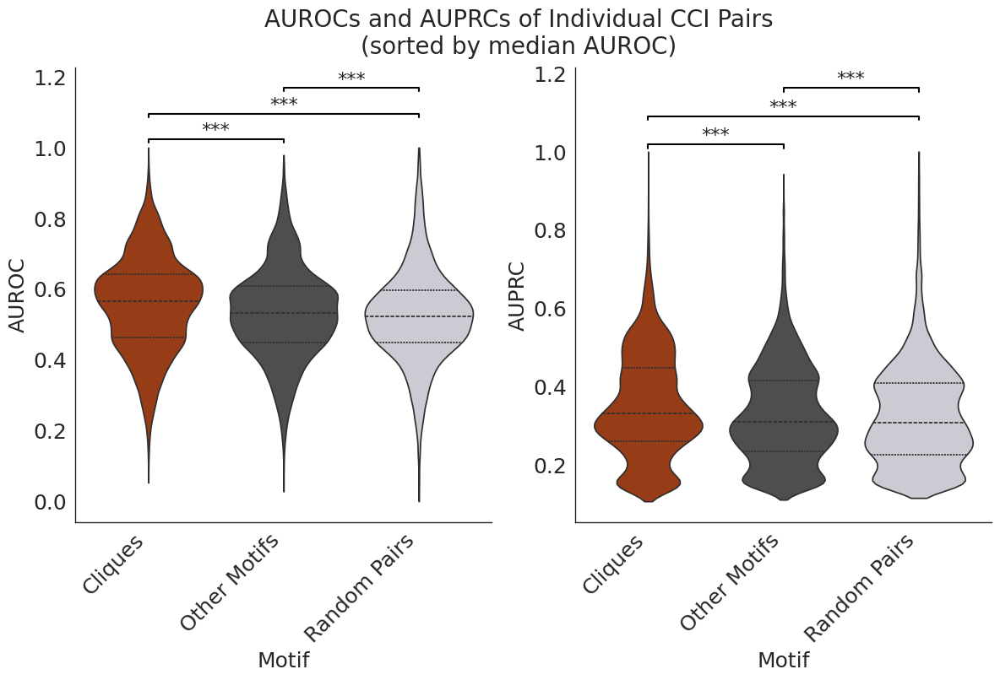

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
import itertools
import numpy as np

fs = 18

palette = {'Random Pairs': lightgray, 'Other Motifs': graycolor, 'Cliques': tcolor}

# Map your motif names if they differ in case or spelling in crosstalkdf
# Assuming your df uses exact keys as palette keys for plotting
# If not, you may need to map them similarly to your regroup function before plotting.

# Sort motif categories by median AUROC
median_auroc = crosstalkdf.groupby('motif')['auroc'].median().sort_values(ascending=False)
sorted_motifs = median_auroc.index.tolist()

# Reorder palette to match sorted motifs
palette_sorted = {motif: palette[motif.title().replace('_', ' ')] if motif.title().replace('_', ' ') in palette else 'gray' for motif in sorted_motifs}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Plot violinplots with sorted order
sns.violinplot(data=crosstalkdf, y='auroc', x='motif', order=sorted_motifs, palette=palette_sorted, ax=ax1, inner='quart', cut=0)
sns.violinplot(data=crosstalkdf, y='auprc', x='motif', order=sorted_motifs, palette=palette_sorted, ax=ax2, inner='quart', cut=0)

# Prepare all pairs for comparison
pairs = list(itertools.combinations(sorted_motifs, 2))

# Function to get p-value for pair and metric
def get_pval(group1, group2, metric):
    data1 = crosstalkdf.query(f'motif == "{group1}"')[metric].dropna()
    data2 = crosstalkdf.query(f'motif == "{group2}"')[metric].dropna()
    return mannwhitneyu(data1, data2).pvalue

# Significance label function
def get_sig_label(pval):
    if pval > 0.05:
        return "ns"
    elif pval > 0.01:
        return "*"
    elif pval > 0.001:
        return "**"
    else:
        return "***"
    return
 
# Function to add significance bars for all pairs
def add_all_significance_bars(ax, metric, y_start=1.0, y_step=0.075, height=0.01):
    ylim = ax.get_ylim()
    y_max = 0.92*ylim[1]
    
    for i, (g1, g2) in enumerate(pairs):
        pval = get_pval(g1, g2, metric)
        x1, x2 = sorted_motifs.index(g1), sorted_motifs.index(g2)
        y = y_max + y_start * y_max + i * y_step * y_max
        
        # Draw bar
        ax.plot([x1, x1, x2, x2], [y, y + height * y_max, y + height * y_max, y], lw=1.5, c='black')
        ax.text((x1 + x2) / 2, y + height * y_max, get_sig_label(pval), ha='center', va='bottom', fontsize=fs*0.9)

# Add significance bars to each plot
add_all_significance_bars(ax1, 'auroc', y_start=0.05)
add_all_significance_bars(ax2, 'auprc', y_start=0.05)

# Formatting axes
for ax in (ax1, ax2):
    ax.tick_params(axis='both', labelsize=fs)
    ax.set_xlabel(ax.get_xlabel().title(), fontsize=fs)
    ax.set_ylabel(ax.get_ylabel().upper(), fontsize=fs)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xticklabels([label.get_text().title().replace('_', ' ') for label in ax.get_xticklabels()], rotation=45, ha='right')

fig.suptitle('AUROCs and AUPRCs of Individual CCI Pairs\n(sorted by median AUROC)', fontsize=fs+2)

#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_pairs_auroc_auprc_violinplot.pdf', bbox_inches='tight', dpi=300)
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_pairs_auroc_auprc_violinplot.png', bbox_inches='tight', dpi=300)    

plt.show()


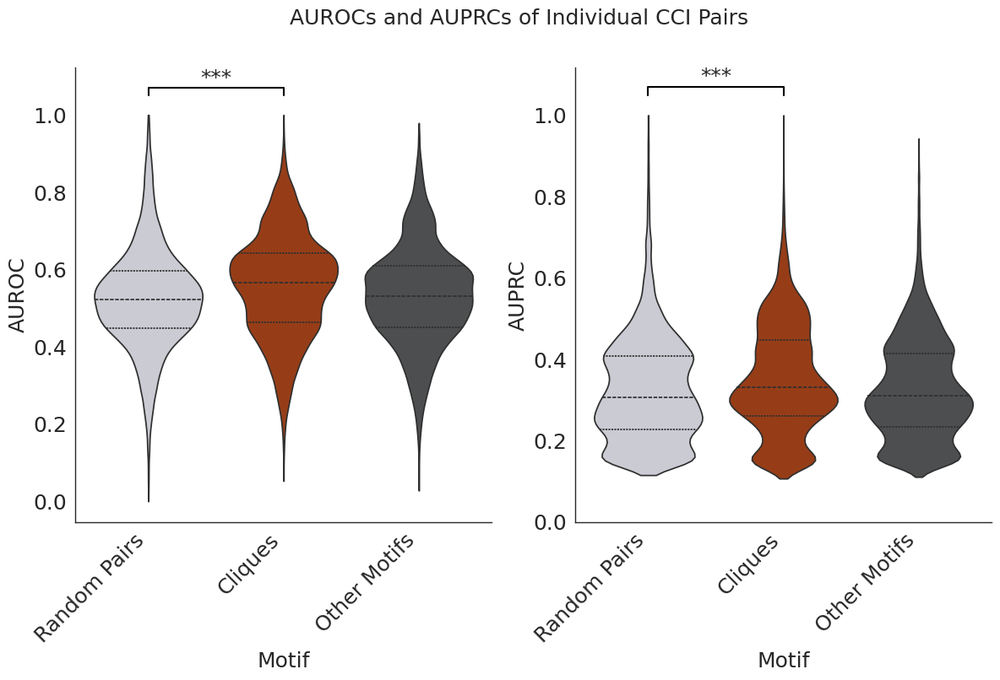

In [25]:
fs = 18

palette = {'Random Pairs': lightgray, 'Other Motifs': graycolor, 'Cliques': tcolor}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

sns.violinplot(crosstalkdf, y='auroc', x='motif', palette=palette, ax=ax1, inner='quart', cut=0)

auroc_result = mannwhitneyu(
    crosstalkdf.dropna().query('motif == "Cliques"')['auroc'],
    crosstalkdf.dropna().query('motif == "Random Pairs"')['auroc'],
)

sns.violinplot(crosstalkdf, y='auprc', x='motif', palette=palette, ax=ax2, inner='quart', cut=0)

auprc_result = mannwhitneyu(
    crosstalkdf.dropna().query('motif == "Cliques"')['auprc'],
    crosstalkdf.dropna().query('motif == "Random Pairs"')['auprc'],
)

# Function to determine significance label
def get_sig_label(pval):
    if pval > 0.05:
        return "ns"
    elif pval > 0.01:
        return "*"
    elif pval > 0.001:
        return "**"
    else:
        return "***"
    #else:
    #    return "****"

# Add significance bars
def add_significance_bar(ax, pval, y_offset=0.05):
    x1, x2 = 0, 1  # Indices of categories
    y_max = 1
    y = y_max + y_offset * y_max  # Adjust height above plot
    ax.plot([x1, x1, x2, x2], [y, y + 0.02 * y_max, y + 0.02 * y_max, y], lw=1.5, c='black')
    ax.text((x1 + x2) / 2, y + 0.02 * y_max, get_sig_label(pval), ha='center', va='bottom', fontsize=fs)

add_significance_bar(ax1, auroc_result.pvalue)
add_significance_bar(ax2, auprc_result.pvalue)

for ax in (ax1, ax2):
    ax.tick_params(axis='both', labelsize=fs)  # Set tick font size
    ax.set_xlabel(ax.get_xlabel().title(), fontsize=fs)  # Set x-axis label font size
    ax.set_ylabel(ax.get_ylabel().upper(), fontsize=fs)  # Set y-axis label font size
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.spines['top'].set_visible(False)  # Hide top spine
    ax.spines['right'].set_visible(False)  # Hide right spine
    ax.set_xticklabels([label.get_text().title().replace('_', ' ') for label in ax.get_xticklabels()], rotation=45, ha='right')

fig.suptitle('AUROCs and AUPRCs of Individual CCI Pairs', fontsize=fs)
    
plt.show()


ValueError: Data passed to ks_2samp must not be empty

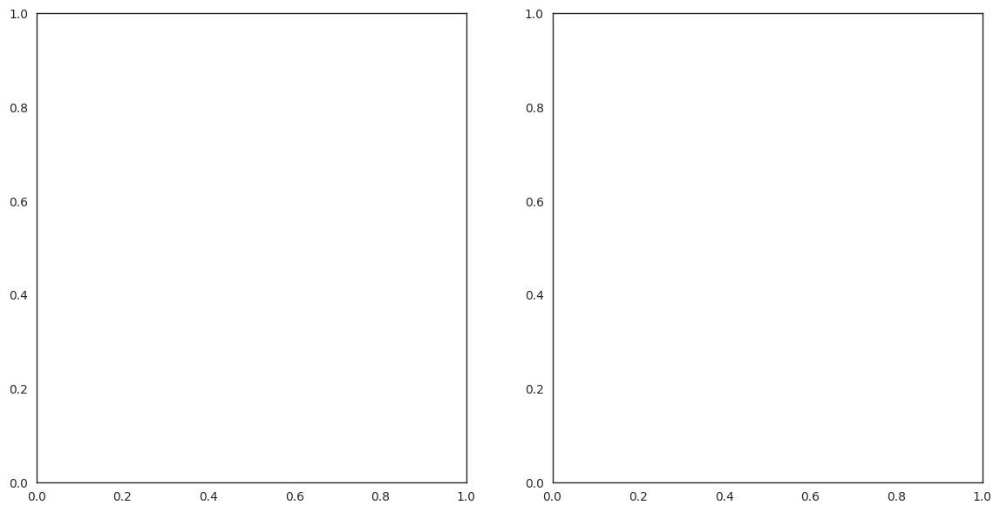

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import ks_2samp

# Function to plot ECDF with KS test annotation
def plot_cdf_with_ks(data, metric, ax, color_random, color_cliques):
    fs = 18
    
    # Filter data for each motif type
    random_values = data.dropna().query('motif == "random_pairs"')[metric]
    cliques_values = data.dropna().query('motif == "cliques"')[metric]

    # Perform KS test
    ks_stat, p_value = ks_2samp(random_values, cliques_values)

    # Plot the ECDFs
    sns.ecdfplot(random_values, ax=ax, color=color_random, label='Random Pairs', linewidth=3)
    sns.ecdfplot(cliques_values, ax=ax, color=color_cliques, label='Cliques', linewidth=3)

    # Compute CDF values
    cdf_random = np.sort(random_values)
    cdf_cliques = np.sort(cliques_values)
    all_values = np.sort(np.unique(np.concatenate((cdf_random, cdf_cliques))))
    cdf_random_y = np.searchsorted(cdf_random, all_values, side='right') / len(cdf_random)
    cdf_cliques_y = np.searchsorted(cdf_cliques, all_values, side='right') / len(cdf_cliques)
    
    # Find max D-statistic difference
    max_diff_index = np.argmax(np.abs(cdf_random_y - cdf_cliques_y))
    x_max_diff = all_values[max_diff_index]
    y1_max_diff = cdf_random_y[max_diff_index]
    y2_max_diff = cdf_cliques_y[max_diff_index]
    midpoint_y = (y1_max_diff + y2_max_diff) / 2

    # Draw the D-statistic vertical line with arrows
    ax.vlines(x_max_diff, y1_max_diff, y2_max_diff, color='k', linestyle='-', lw=2)
    ax.arrow(x_max_diff, y1_max_diff, 0, y2_max_diff - y1_max_diff, 
             color='k', linestyle='-', lw=2, head_width=0.02, head_length=0.02, length_includes_head=True, zorder=10)
    ax.arrow(x_max_diff, y2_max_diff, 0, y1_max_diff - y2_max_diff, 
             color='k', linestyle='-', lw=2, head_width=0.02, head_length=0.02, length_includes_head=True, zorder=10)

    # Add the D-statistic and p-value annotation
    text_object = ax.text(
        0.31, 0.85,
        f'D = {ks_stat:.2f}\np = {p_value:.1e}',
        fontsize=fs - 2, ha='right', va='center',
        transform=ax.transAxes,
    )

    # Adjust annotation connection line
    text_x, text_y = text_object.get_position()
    max_diff_axis_rel = ax.transData.transform((x_max_diff, midpoint_y))
    max_diff_axis_rel_x, max_diff_axis_rel_y = ax.transAxes.inverted().transform(max_diff_axis_rel)
    
    direction_x = max_diff_axis_rel_x - text_x
    direction_y = max_diff_axis_rel_y - text_y
    offset_x = direction_x * 0.85
    offset_y = direction_y * 0.85

    start_x = text_x + offset_x
    start_y = text_y + offset_y
    end_x = max_diff_axis_rel_x - offset_x
    end_y = max_diff_axis_rel_y - offset_y
    
    ax.plot([start_x, end_x], [start_y, end_y], color='k', lw=1, linestyle='-', zorder=9, transform=ax.transAxes)

    # Style settings
    ax.set_xlabel(metric.upper(), fontsize=fs)
    ax.set_ylabel('Cumulative Probability', fontsize=fs)
    ax.tick_params(labelsize=fs)
    ax.legend(fontsize=fs, loc='lower right')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(False)

# Create subplots for AUROC and AUPRC
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Plot AUROC and AUPRC ECDFs
plot_cdf_with_ks(crosstalkdf, 'auroc', ax1, lightgray, tcolor)
plot_cdf_with_ks(crosstalkdf, 'auprc', ax2, lightgray, tcolor)

fig.suptitle('Cumulative Distribution of AUROC and AUPRC for CCI Pairs', fontsize=18)

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_pairs_auroc_auprc_cumulative.pdf', bbox_inches='tight', dpi=300)
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_pairs_auroc_auprc_cumulative.png', bbox_inches='tight', dpi=300)    

# Show plot
plt.show()


In [27]:
better = crosstalkdf.query('auroc > auroc1 and auroc > auroc2')
better = better.query('auprc > auprc1 and auprc > auprc2')

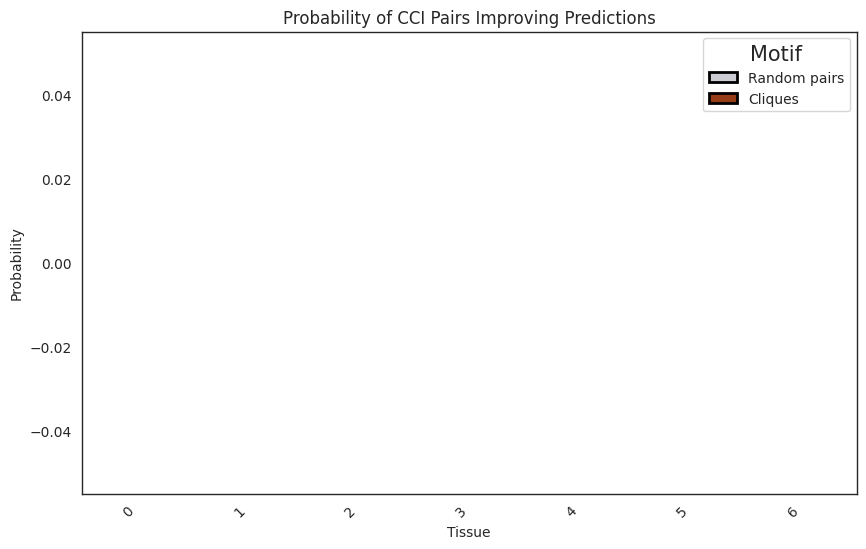

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Compute probabilities separately for each tissue
probs_by_tissue = []
for tissue, better_group in better.groupby('tissue'):
    crosstalk_group = crosstalkdf[crosstalkdf['tissue'] == tissue]
    
    probs = (better_group.dropna().motif.value_counts() / crosstalk_group.dropna().motif.value_counts()).dropna()
    
    df = probs.reset_index()
    df.columns = ['motif', 'prob']
    df['tissue'] = tissue
    probs_by_tissue.append(df)

# Combine results
plot_df = pd.concat(probs_by_tissue)

# Sort tissues by "cliques" probability (ascending order)
tissue_order = (
    plot_df[plot_df['motif'] == 'cliques']
    .sort_values(by='prob', ascending=True)['tissue']
    .tolist()
)

# Set tissue as categorical with the specified order
plot_df['tissue'] = pd.Categorical(plot_df['tissue'], categories=tissue_order, ordered=True)

# Plot barplot
plt.figure(figsize=(10, 6))
#palette={'cliques': orangecolor, 'random_pairs':lightgray}
#palette={'cliques': tcolor, 'random_pairs': ncolor}
palette={'cliques': tcolor, 'random_pairs': lightgray}

hue_order=['random_pairs', 'cliques']
sns.barplot(data=plot_df, x='tissue', y='prob', hue='motif', palette=palette, linewidth=2, edgecolor='k', hue_order=hue_order)

# Improve x-axis readability
plt.xticks(rotation=45, ha='right')

# Capitalize x labels and replace underscores with spaces
new_labels = [label.get_text().title().replace('_', ' ') for label in plt.gca().get_xticklabels()]
plt.gca().set_xticklabels(new_labels)

# Capitalize legend labels and replace underscores with spaces
handles, labels = plt.gca().get_legend_handles_labels()
new_labels_legend = [label.capitalize().replace('_', ' ') for label in labels]
plt.legend(handles=handles, labels=new_labels_legend, title='Motif')

plt.xlabel('Tissue')
plt.ylabel('Probability')
plt.title('Probability of CCI Pairs Improving Predictions')

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_pairs_tissues_prob_better.pdf', bbox_inches='tight', dpi=300)
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_pairs_tissues_prob_better.png', bbox_inches='tight', dpi=300)    

plt.show()


# Heatmap Top by Mean Across Tissues

In [99]:
## Read the results
parentdir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/individual_interactions_and_motifs'

dfs = []

for tissue in os.listdir(parentdir):
    #if tissue in ['full_dataset']: # add back lymph and ureter when they finish running
    #    continue
    path = os.path.join(parentdir, tissue, 'aggregated', 'aggregated.csv')
    tissuedf = pd.read_csv(os.path.join(path))
    tissuedf = tissuedf.rename(columns={'Unnamed: 0': 'interaction'})
    #tissuedf['motif'] = tissuedf['motif'].replace({'3_clique': 'cliques', '4_clique': 'cliques'})

    dfs.append(tissuedf)
        
crosstalkdf = pd.concat(dfs, ignore_index=True)
crosstalkdf = crosstalkdf.dropna()

crosstalkdf = crosstalkdf.sort_values(by='auroc')[::-1]

crosstalkdf = crosstalkdf.query('motif in ["3_clique", "4_clique"]')
#crosstalkdf = crosstalkdf.query('tissue != "full_dataset"')

better = crosstalkdf.query('auroc > auroc1 and auroc > auroc2')
better = better.query('auprc > auprc1 and auprc > auprc2')

crosstalkdf['interaction'] = crosstalkdf.interaction.str.replace('_', ' - ').str.replace('+', ' - ').str.replace('&', ' & ')
better['interaction'] = better.interaction.str.replace('_', ' - ').str.replace('+', ' - ').str.replace('&', ' & ')

# Get top interactions by mean auroc
interactions_show = crosstalkdf.groupby('interaction')['auroc'].mean().sort_values()[::-1].head(50).index.tolist()

# Get top interactions in each tissue
#interactions_show = better.sort_values(by='auroc')[::-1].groupby('tissue').head(5).interaction.tolist()

# Filter crosstalkdf for these top interactions only
# Prepare pivot
aurocs_df = crosstalkdf.pivot_table(
    index='interaction',
    columns='tissue',
    values='auroc',
    aggfunc='mean'
)

aurocs_df['interaction'] = aurocs_df.index

aurocs_df = aurocs_df[aurocs_df['interaction'].isin(interactions_show)]
#aurocs_df['interaction'] = aurocs_df.interaction.str.replace('_', ' - ').str.replace('+', ' - ').str.replace('&', ' & ')

import re

# Split interactions into individual genes for each side
aurocs_df['interaction1'] = aurocs_df.interaction.apply(lambda x: re.split('&', x)[0].strip().split(' - '))
aurocs_df['interaction2'] = aurocs_df.interaction.apply(lambda x: re.split('&', x)[1].strip().split(' - '))

# Load hallmark gene sets
def read_gmt(file_path):
    gene_sets = {}
    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split('\t')
            if len(parts) >= 3:
                gene_sets[parts[0]] = set(parts[2:])
    return gene_sets

hallmarks_path = '/home/lnemati/resources/msigdb_hallmarks/h.all.v2024.1.Hs.symbols.gmt'
hallmarks = read_gmt(hallmarks_path)

# Generate cleaned hallmark labels
labels = [label.replace('HALLMARK_', '').replace('_', ' ').title() for label in hallmarks.keys()]

replace = {
    'Myc': 'MYC',
    'Kras': 'KRAS',
    'Il2': 'IL2',
    'Stat5': 'STAT5',
    'Il6': 'IL6',
    'Jak': 'JAK',
    'Stat3': 'STAT3',
    'P53': 'P53',
    'Tnfa': 'TNFα',
    'Nfkb': 'NF-κB',
    'Mtorc1': 'MTORC1',
    ' Dn': ' Down'
}
for str1, str2 in replace.items():
    labels = [label.replace(str1, str2) for label in labels]

hallmark_name_map = dict(zip(hallmarks.keys(), labels))

# Function to find matching hallmark sets for a given gene list
def find_matching_hallmarks(gene_list, hallmark_sets):
    return [name for name, genes in hallmark_sets.items() if set(gene_list) & genes]

# Get hallmarks for each side of the interaction
aurocs_df['hallmarks1'] = aurocs_df['interaction1'].apply(lambda genes: find_matching_hallmarks(genes, hallmarks))
aurocs_df['hallmarks2'] = aurocs_df['interaction2'].apply(lambda genes: find_matching_hallmarks(genes, hallmarks))

# Convert to readable labels using the name map
aurocs_df['hallmarks1'] = aurocs_df['hallmarks1'].apply(lambda hlist: [hallmark_name_map[h] for h in hlist])
aurocs_df['hallmarks2'] = aurocs_df['hallmarks2'].apply(lambda hlist: [hallmark_name_map[h] for h in hlist])

In [100]:
import numpy as np

# Define subset of hallmarks you want to consider (for example, top N or all unique found)
# For demonstration, use all unique hallmarks found across both sides:
all_hallmarks = sorted(set(sum(aurocs_df['hallmarks1'], [])) | set(sum(aurocs_df['hallmarks2'], [])))

# Initialize matrix: rows = interactions, columns = hallmarks
heatmap_matrix = np.zeros((len(aurocs_df), len(all_hallmarks)), dtype=int)

# Fill matrix with presence codes
for i, row in enumerate(aurocs_df.itertuples(index=False)):
    hallmarks_1 = set(row.hallmarks1)
    hallmarks_2 = set(row.hallmarks2)
    for j, hallmark in enumerate(all_hallmarks):
        in_1 = hallmark in hallmarks_1
        in_2 = hallmark in hallmarks_2
        heatmap_matrix[i, j] = 1 * in_1 + 2 * in_2  # 0, 1, 2, or 3

heatmap_df = pd.DataFrame(heatmap_matrix, index=aurocs_df.interaction, columns=all_hallmarks)    
heatmap_df = heatmap_df[::-1] # Invert to match order of the plot

# Values:
# 0 = not present
# 1 = interaction1
# 2 = interaction2
# 3 = both interactions

aurocs_df = aurocs_df[['bladder', 'brain', 'full_dataset', 'kidney', 'lung', 'lymphatic_tissue', 'skin', 'stomach', 'ureter']]

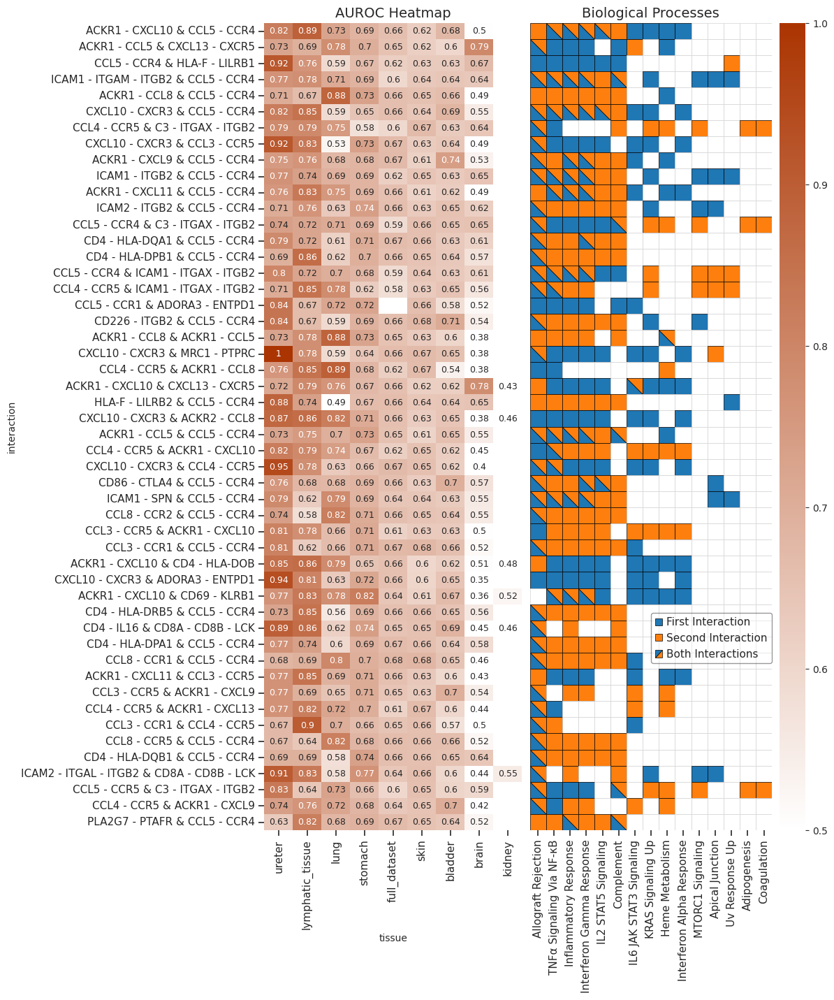

In [101]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import numpy as np
import seaborn as sns
from matplotlib.legend_handler import HandlerBase

# --- Settings ---
titlefs = 14
fs = 11
smallfs = 9
height = 0.8

# Example placeholders for your data frames and variables (replace these with your actual data)
# aurocs_df = ...  # Your AUROC dataframe
# heatmap_df = ... # Your heatmap dataframe
# tcolor = 'blue'  # Example target color for colormap

order_tissues = aurocs_df.mean(axis=0).sort_values(ascending=False).index
order_interactions = aurocs_df.mean(axis=1).sort_values(ascending=False).index
aurocs_df = aurocs_df.loc[order_interactions, order_tissues]

# Heatmap prep
N = 15
hallmark_counts = (heatmap_df != 0).sum(axis=0)
top_hallmarks = hallmark_counts.sort_values(ascending=False).head(N).index
top_heatmap_df = heatmap_df[top_hallmarks]
top_heatmap_df = top_heatmap_df.loc[aurocs_df.index]
hallmark_matrix = top_heatmap_df.values

# --- Plotting ---
fig = plt.figure(figsize=(10, 15))
gs = gridspec.GridSpec(1, 3, width_ratios=[1., 1., 0.1], wspace=0.)
ax = fig.add_subplot(gs[0])      # AUROC heatmap
ax_hm = fig.add_subplot(gs[1])   # Biological process heatmap
ax_cbar = fig.add_subplot(gs[2]) # Colorbar

# --- Left: AUROC heatmap via seaborn ---
vmin, vmax = 0.5, 1.0
cmap = mcolors.LinearSegmentedColormap.from_list("white_to_color", ["white", tcolor])

sns.heatmap(
    aurocs_df,
    annot=True,
    cmap=cmap,
    cbar_ax=ax_cbar,
    ax=ax,
    vmin=vmin,
    vmax=vmax,
    annot_kws={"fontsize": smallfs}
)

# --- Right: Process Heatmap using patches ---
ax_hm.set_yticks([])  # Hide y ticks
ax_hm.set_xticks(np.arange(hallmark_matrix.shape[1]) + 0.5)
ax_hm.set_xticklabels(top_heatmap_df.columns, rotation=90, fontsize=fs)

# Minor ticks for grid lines
#ax_hm.set_xticks(np.arange(hallmark_matrix.shape[1] + 1), minor=True)
ax_hm.set_yticks(np.arange(hallmark_matrix.shape[0] + 1), minor=True)
ax_hm.grid(which='minor', color='white', linewidth=2.5)
ax_hm.tick_params(which='minor', bottom=False, left=False, length=6, width=1.2)
ax_hm.tick_params(axis='x', which='both', bottom=True, top=False, length=6, width=1.2)

# Draw cells
for i in range(hallmark_matrix.shape[0]):
    for j in range(hallmark_matrix.shape[1]):
        val = hallmark_matrix[i, j]
        if val == 0:
            facecolor = 'white'
            edgecolor = 'lightgray'
            rect = patches.Rectangle((j, i), 1, 1, facecolor=facecolor, edgecolor=edgecolor, linewidth=0.5)
            ax_hm.add_patch(rect)
        elif val == 1:
            rect = patches.Rectangle((j, i), 1, 1, facecolor='C0', edgecolor='k', linewidth=0.5)
            ax_hm.add_patch(rect)
        elif val == 2:
            rect = patches.Rectangle((j, i), 1, 1, facecolor='C1', edgecolor='k', linewidth=0.5)
            ax_hm.add_patch(rect)
        elif val == 3:
            tri1 = patches.Polygon([(j, i), (j, i + 1), (j + 1, i + 1)], facecolor='C0', edgecolor='k', linewidth=0.5)
            tri2 = patches.Polygon([(j, i), (j + 1, i), (j + 1, i + 1)], facecolor='C1', edgecolor='k', linewidth=0.5)
            ax_hm.add_patch(tri1)
            ax_hm.add_patch(tri2)

ax_hm.set_xlim(0, hallmark_matrix.shape[1])
ax_hm.set_ylim(hallmark_matrix.shape[0], 0)
ax_hm.set_aspect('equal', adjustable='box')
ax_hm.set_title('Biological Processes', fontsize=titlefs)

# --- Legend with split square for "Both Interactions" ---
class HandlerSplitSquare(HandlerBase):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        tri1 = patches.Polygon([[xdescent, ydescent],
                                [xdescent, ydescent + height],
                                [xdescent + width, ydescent + height]],
                               facecolor='C0', edgecolor='k', linewidth=0.5, transform=trans)
        tri2 = patches.Polygon([[xdescent, ydescent],
                                [xdescent + width, ydescent],
                                [xdescent + width, ydescent + height]],
                               facecolor='C1', edgecolor='k', linewidth=0.5, transform=trans)
        return [tri1, tri2]

patch_c0 = patches.Rectangle((0, 0), 1, 1, facecolor='C0', edgecolor='k', linewidth=0.5)
patch_c1 = patches.Rectangle((0, 0), 1, 1, facecolor='C1', edgecolor='k', linewidth=0.5)
split_square_handle = object()

ax_hm.legend(
    handles=[patch_c0, patch_c1, split_square_handle],
    labels=['First Interaction', 'Second Interaction', 'Both Interactions'],
    handler_map={split_square_handle: HandlerSplitSquare()},
    loc='lower center',
    bbox_to_anchor=(0.75, 0.2),
    fontsize=fs,
    ncol=1,
    frameon=True,
    facecolor='white',
    framealpha=0.4,
    edgecolor='black',
    handlelength=0.65,
    handleheight=0.65,
    handletextpad=0.4,
)

# --- Spine visibility ---
for spine in ax.spines.values():
    spine.set_visible(False)
for spine in ax_hm.spines.values():
    spine.set_visible(False)

# --- Tick parameters consistent with your original style ---
ax.tick_params(bottom=True, top=False, left=True, labelbottom=True, labelsize=fs, length=6, width=1.2)
ax_hm.tick_params(bottom=True, top=False, left=False, labelbottom=True, labelsize=fs, length=6, width=1.2)

# --- Titles ---
ax.set_title('AUROC Heatmap', fontsize=titlefs)
ax_hm.set_title('Biological Processes', fontsize=titlefs)

#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/aurocs_heatmap.pdf', bbox_inches='tight', dpi=300)
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/aurocs_heatmap.png', bbox_inches='tight', dpi=300)

plt.show()


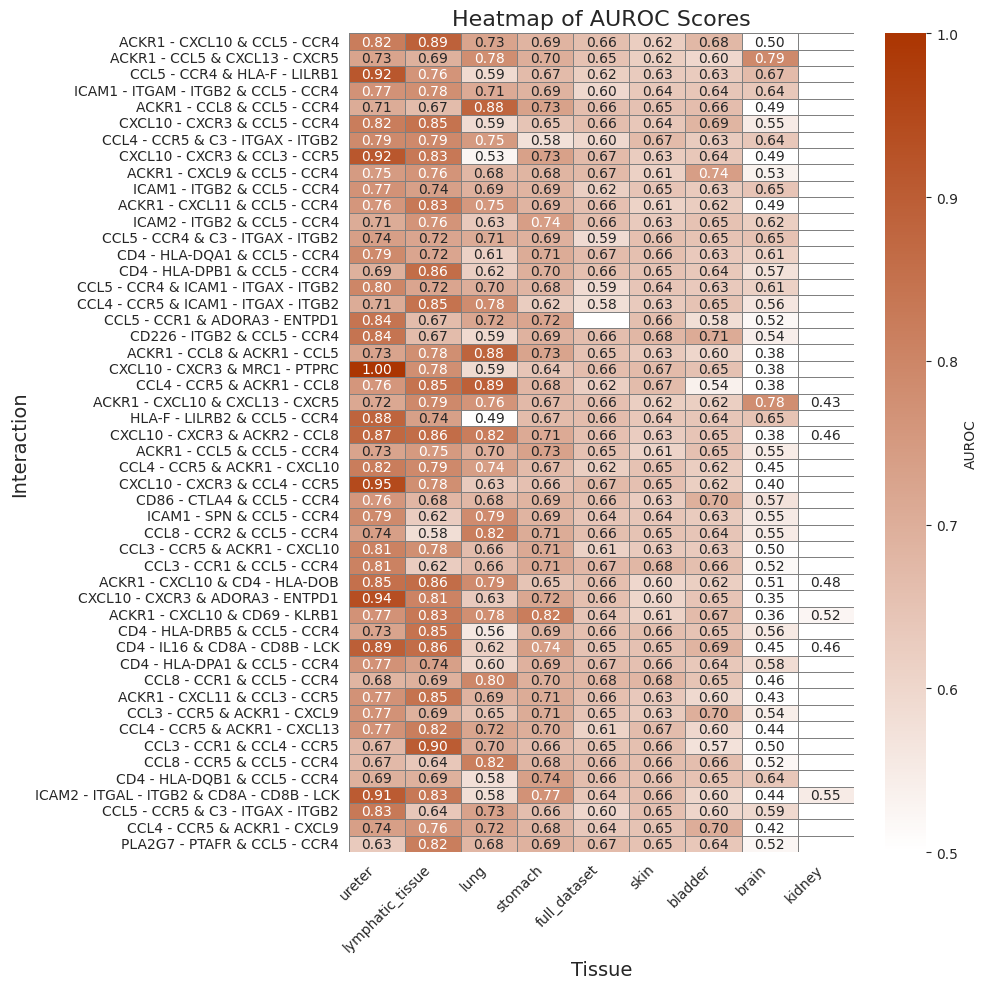

In [91]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Assuming 'crosstalkdf' and 'better' are already defined

# Get top interactions by frequency in 'better'
#interactions_show = better['interaction'].value_counts().head(50).index.tolist()

# Create a pivot table with interactions as rows, tissues as columns, and mean auroc as values
pivot_table = aurocs_df.pivot_table(
    index='interaction',
    columns='tissue',
    values='auroc',
    aggfunc='mean'
)

# Sort tissues
order_tissues =  pivot_table.mean(axis=0).sort_values(ascending=False).index
order_interactions =  pivot_table.mean(axis=1).sort_values(ascending=False).index
pivot_table = pivot_table.loc[order_interactions, order_tissues]

# Define custom diverging colormap
# Make sure ncolor and tcolor are already defined somewhere before this
# Example: ncolor = '#2166ac', tcolor = '#b2182b'
diverging_cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_diverging',
    ['white', tcolor]
)

# Standard heatmap
plt.figure(figsize=(10, 10))
ax = sns.heatmap(
    pivot_table,
    cmap=diverging_cmap,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'AUROC'},
    vmin=0.5,
    xticklabels=True,
    yticklabels=True
)

# Formatting
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.xlabel('Tissue', fontsize=14)
plt.ylabel('Interaction', fontsize=14)
plt.title('Heatmap of AUROC Scores', fontsize=16)

plt.tight_layout()
plt.show()


In [ ]:
crosstalkdf.groupby('interaction')['auroc'].mean().sort_values()[::-1]

tissue: bladder
interaction: CD86+CTLA4&CCL22+CCR4
interaction: CCL22+CCR4&CD80+CTLA4
interaction: CD4+HLA-DOB&CD209+ICAM2
interaction: CCL22+CCR4&ICAM2+ITGAL_ITGB2
interaction: ICAM1+ITGAL_ITGB2&CCL22+CCR4
tissue: brain
interaction: CD52+SIGLEC10&HCST_KLRK1+MICA
interaction: CD4+HLA-DQA1&MRC1+PTPRC
interaction: CD4+HLA-DRB1&CD4+HLA-DMB
interaction: CD8B+HLA-F&CD8A+HLA-A
interaction: ICAM1+ITGAX_ITGB2&CD4+HLA-DMB
tissue: kidney
interaction: CD4+HLA-DRB5&HLA-F+LILRB2
interaction: CXCL11+DPP4&CCL22+DPP4
interaction: CCL8+CCR5&CCL22+CCR4
interaction: CSF1+CSF1R&CD274+CD80
interaction: CSF1+CSF1R&CCL22+CCR4
tissue: lung
interaction: CXCL11+CXCR3&EGFR+HBEGF
interaction: CXCL11+CXCR3&ACVR1_ACVR2A+BMP6
interaction: CD4+HLA-DRA&ENTPD1+TMIGD3
interaction: TNFRSF8+TNFSF8&SFRP4+WNT2
interaction: SELL+SELPLG&ACKR1+CCL18
tissue: lymphatic_tissue
interaction: CD4+HLA-DRB5&CYSLTR1+DPEP2
interaction: CD4+HLA-DRB5&CD4+HLA-DMB
interaction: FN1+ITGAV_ITGB5&FN1+ITGA2_ITGB1
interaction: CD4+HLA-DRB5&CD209+

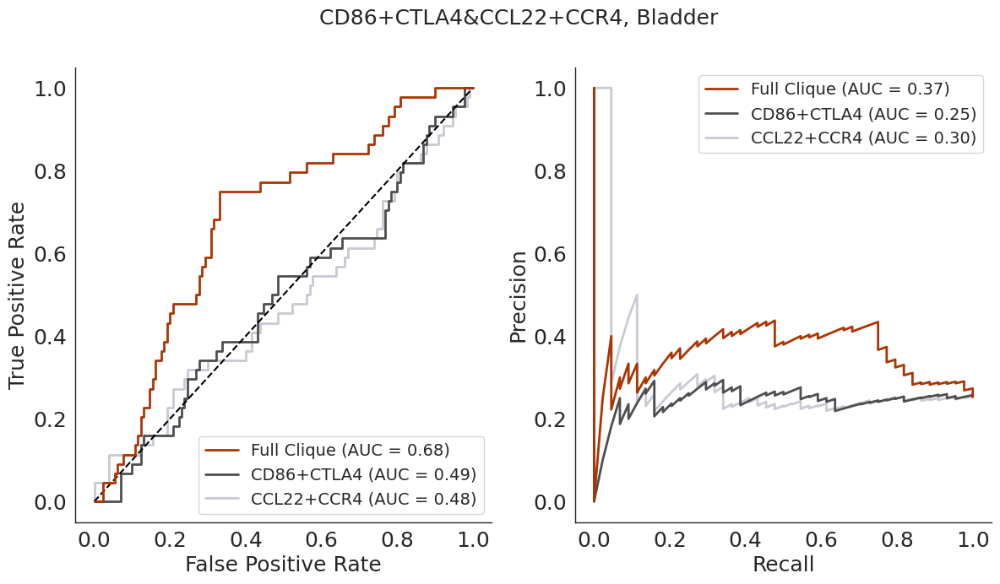

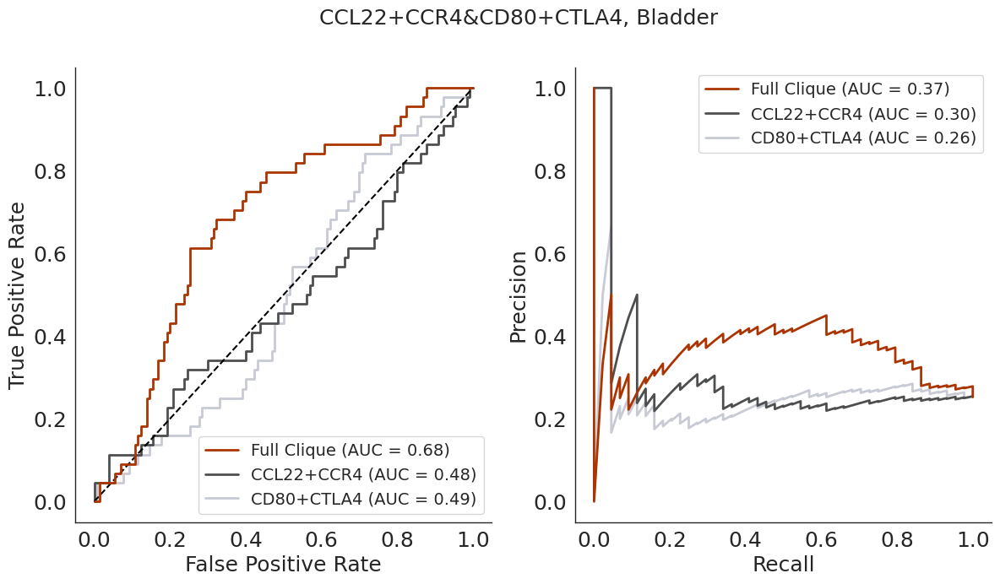

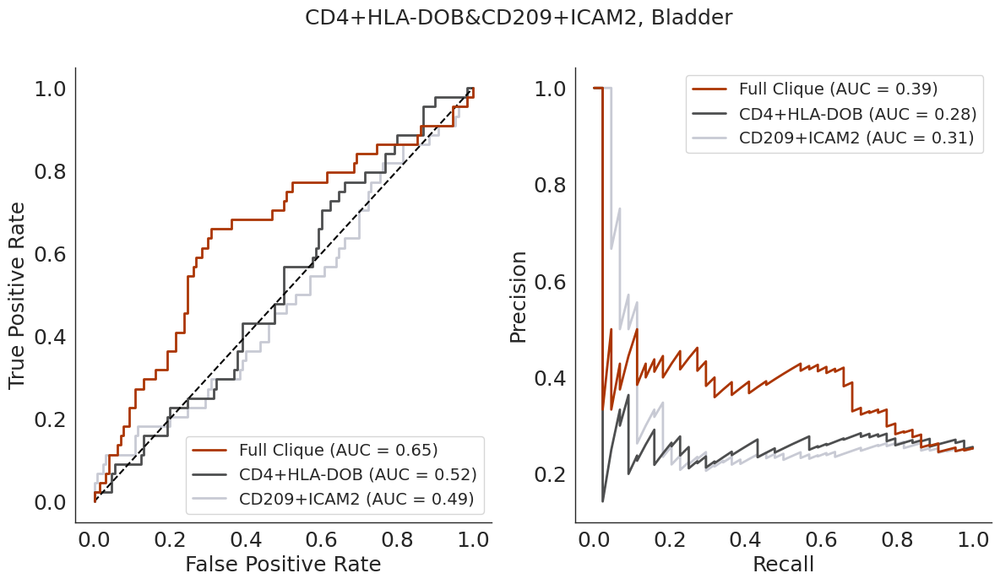

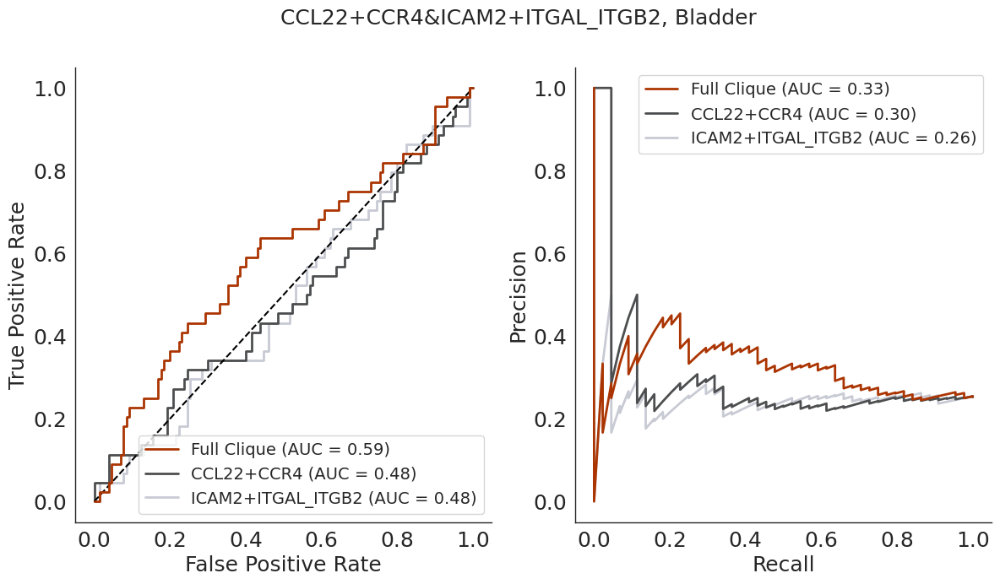

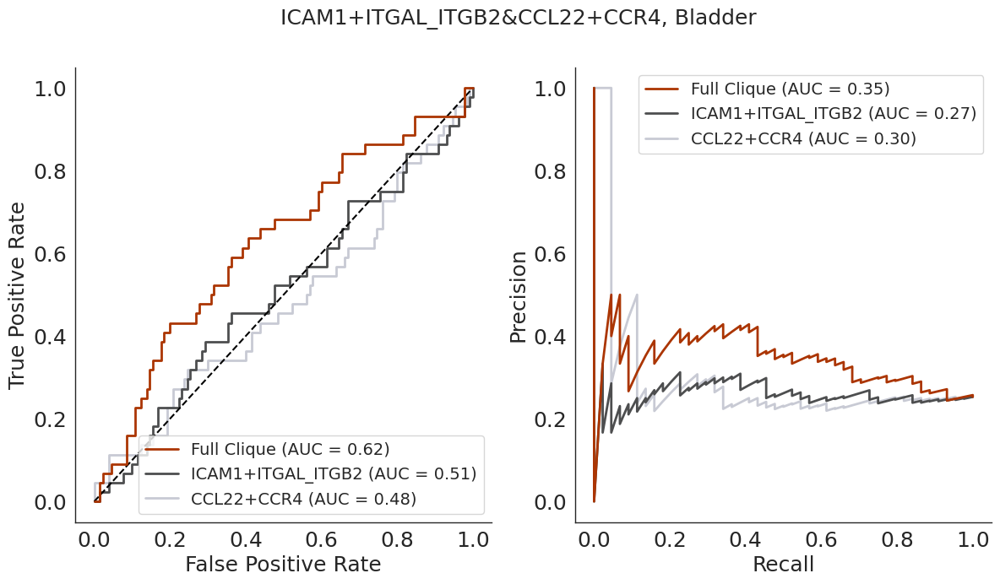

...

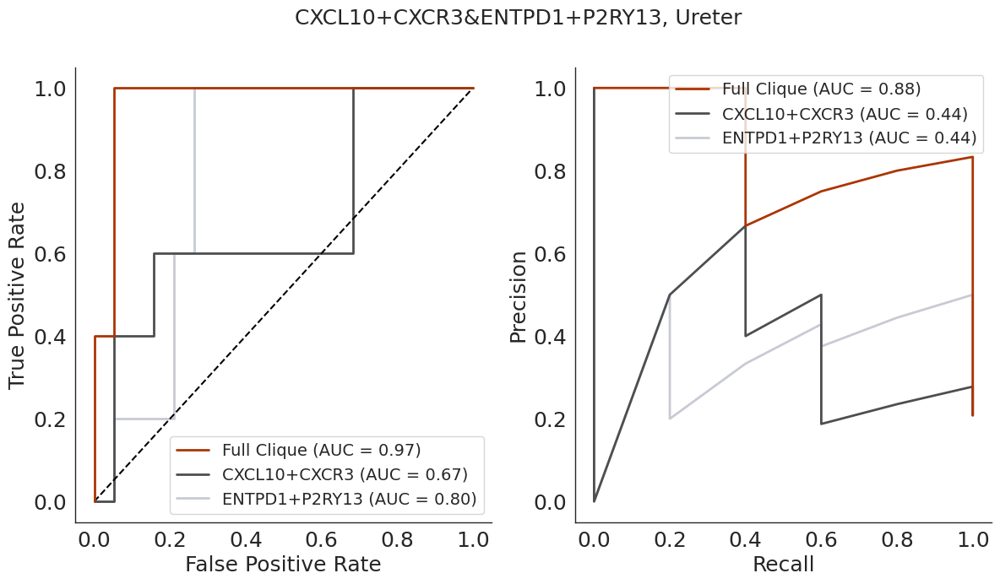

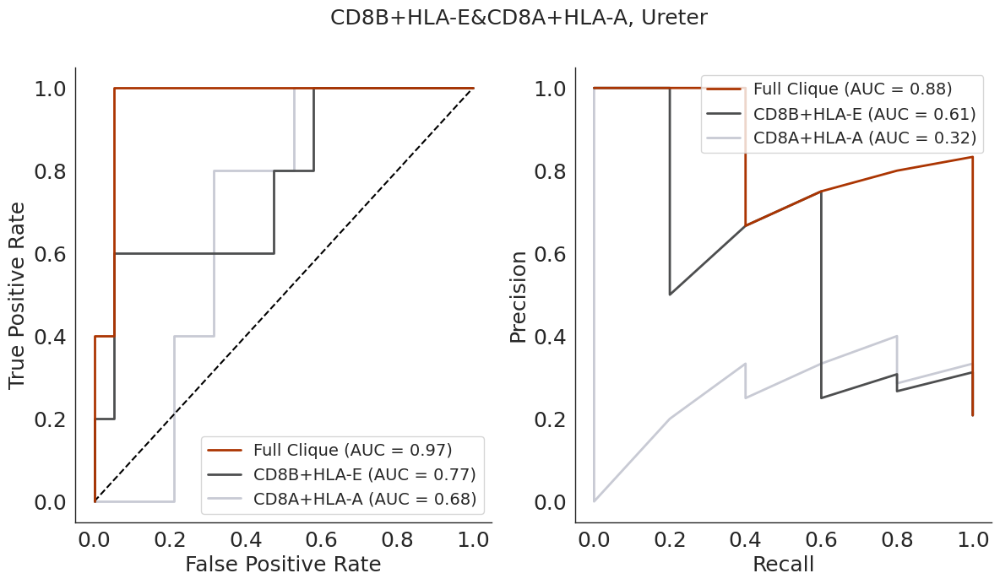

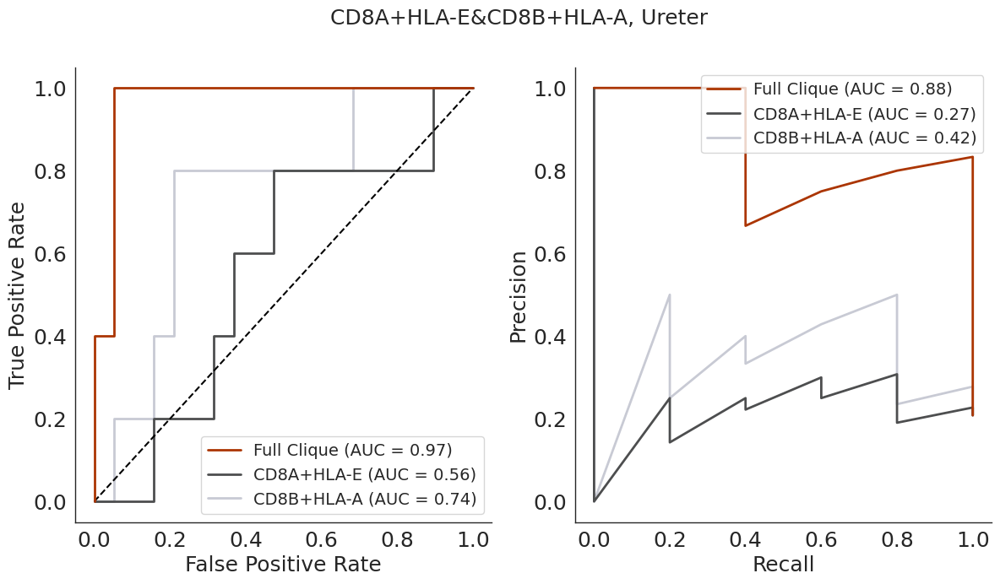

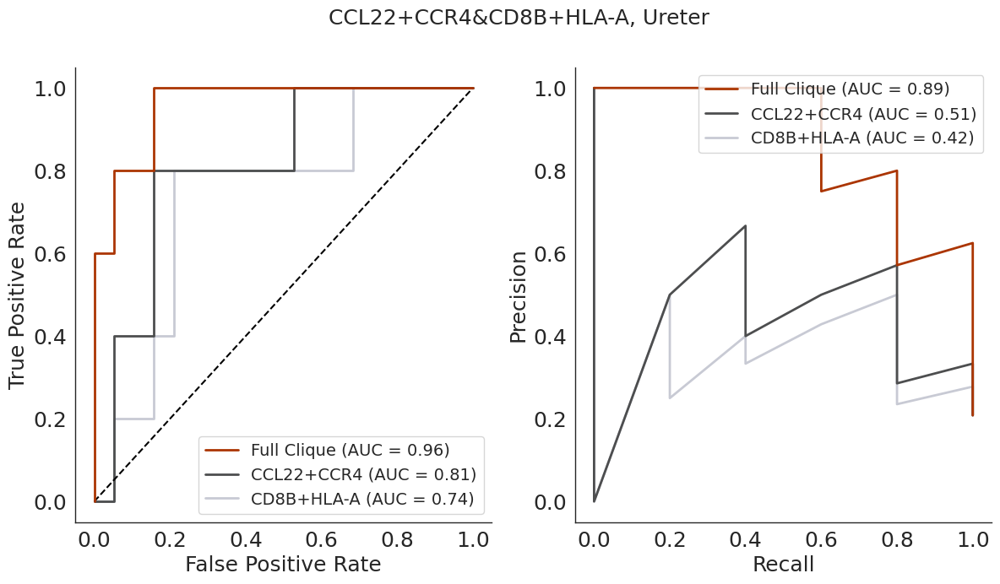

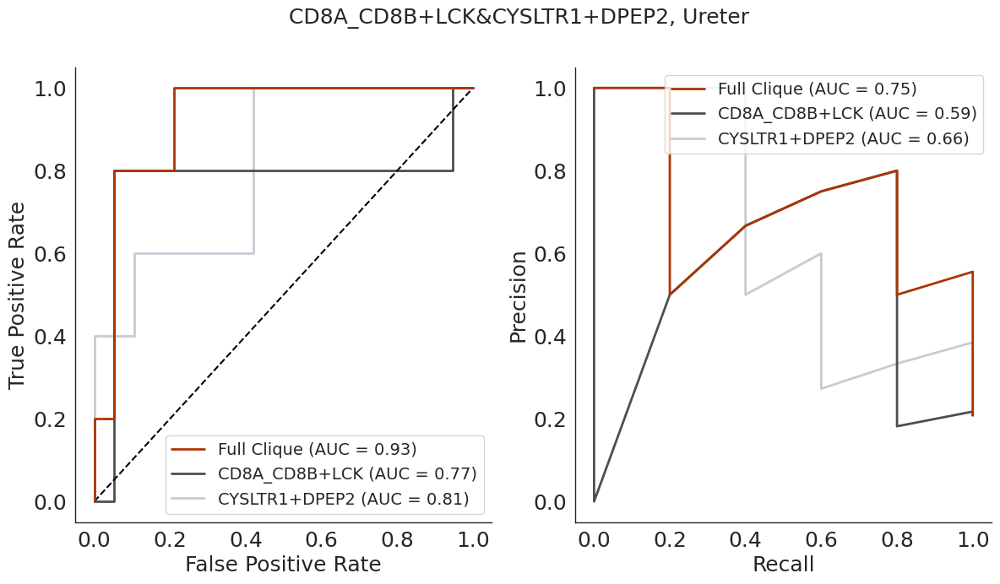

In [97]:
# SORTED BY INCREASE IN AUROC

import os
import pandas as pd
import re
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

n_top = 5

# Sort by increase in auroc and select top 3 interactions per tissue
top_values = (
    better.query('motif == "cliques"')  # Filter by motif
    .groupby('tissue')  # Group by tissue
    .apply(lambda x: x.nlargest(n_top, 'auroc_diff'))  # Get top by 'auroc'
    .reset_index(drop=True)  # Reset the index after applying
).set_index('interaction')

parentdir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/individual_interactions_and_motifs'

# Define colors for each plot (just for better visibility)
colors = [tcolor, graycolor, lightgray]

# Set font size for all elements
fs = 18
legendfs = 14
plt.rcParams.update({'font.size': fs})  # Update the global font size

# Loop over the top 3 interactions per tissue
for tissue, group in top_values.groupby('tissue'):
    print(f"tissue: {tissue}")

    # Loop over the top 3 interactions for this tissue
    for idx, row in group.iterrows():
        interaction = row.name  # Interaction name (set as index)
        best_interaction = interaction
        int1, int2 = best_interaction.split('&')

        print(f"interaction: {best_interaction}")

        path = os.path.join(parentdir, tissue, 'prediction_probabilities')
        df = pd.concat([
            pd.read_csv(os.path.join(path, '3_clique.csv'), index_col=0),
            pd.read_csv(os.path.join(path, '4_clique.csv'), index_col=0),
            pd.read_csv(os.path.join(path, 'individual_ccis.csv'), index_col=0),
        ])
        
        # Convert all_genes to sorted tuples
        df['all_genes'] = pd.Series(df.index, index=df.index).apply(lambda x: tuple(sorted(set(re.split('[&+_]', x)))))
        
        # Get the probability for the best interaction and the individual interactions
        clique_probs = df[df['all_genes'] == tuple(sorted(set(re.split('[&+_]', best_interaction))))]    
        int1_probs = df[df['all_genes'] == tuple(sorted(set(re.split('[&+_]', int1))))]    
        int2_probs = df[df['all_genes'] == tuple(sorted(set(re.split('[&+_]', int2))))]    

        df = df.drop(columns='all_genes')
        
        clique_probs = clique_probs.drop(columns='all_genes')
        int1_probs = int1_probs.drop(columns='all_genes')
        int2_probs = int2_probs.drop(columns='all_genes')
        
        # Ensure there is data in these DataFrames
        if len(clique_probs) == 0 or len(int1_probs) == 0 or len(int2_probs) == 0:
            continue
        
        # Extract true labels, convert 'R' to 1 and 'N' to 0
        true_labels = df.iloc[0].map({'R': 1, 'N': 0})  # Convert 'R' to 1 (positive) and 'N' to 0 (negative)
        
        # Extract the predicted probabilities (assuming they're in the first column of the data)
        clique_prob_values = clique_probs.iloc[0].values.astype(float)  # Modify this as per the correct column
        int1_prob_values = int1_probs.iloc[0].values.astype(float)  # Modify this as per the correct column
        int2_prob_values = int2_probs.iloc[0].values.astype(float)  # Modify this as per the correct column

        # Compute ROC curve and AUC for each
        fpr_clique, tpr_clique, _ = roc_curve(true_labels, clique_prob_values)
        fpr_int1, tpr_int1, _ = roc_curve(true_labels, int1_prob_values)
        fpr_int2, tpr_int2, _ = roc_curve(true_labels, int2_prob_values)

        auc_clique = auc(fpr_clique, tpr_clique)
        auc_int1 = auc(fpr_int1, tpr_int1)
        auc_int2 = auc(fpr_int2, tpr_int2)

        # Initialize a figure for the ROC and Precision-Recall plot
        fig, axes = plt.subplots(1, 2, figsize=(14, 7))
        
        # Plot each ROC curve on the first subplot (Axes 1)
        axes[0].plot(fpr_clique, tpr_clique, color=colors[0], label=f'Full Clique (AUC = {auc_clique:.2f})', lw=2, zorder=3)
        axes[0].plot(fpr_int1, tpr_int1, color=colors[1], label=f'{int1} (AUC = {auc_int1:.2f})', lw=2, zorder=2)
        axes[0].plot(fpr_int2, tpr_int2, color=colors[2], label=f'{int2} (AUC = {auc_int2:.2f})', lw=2, zorder=1)

        # Add a diagonal line for random classifier
        axes[0].plot([0, 1], [0, 1], color='black', linestyle='--', label=None)

        # Customize the ROC plot
        #axes[0].set_title(f'ROC Curves for Different Interactions - {tissue}', fontsize=fs)
        axes[0].set_xlabel('False Positive Rate')
        axes[0].set_ylabel('True Positive Rate')
        axes[0].legend(loc='lower right', fontsize=legendfs)
        
        # Remove top and right spines for the ROC plot
        axes[0].spines['top'].set_visible(False)
        axes[0].spines['right'].set_visible(False)

        # Compute Precision-Recall curve and Average Precision for each
        precision_clique, recall_clique, _ = precision_recall_curve(true_labels, clique_prob_values)
        precision_int1, recall_int1, _ = precision_recall_curve(true_labels, int1_prob_values)
        precision_int2, recall_int2, _ = precision_recall_curve(true_labels, int2_prob_values)

        avg_precision_clique = average_precision_score(true_labels, clique_prob_values)
        avg_precision_int1 = average_precision_score(true_labels, int1_prob_values)
        avg_precision_int2 = average_precision_score(true_labels, int2_prob_values)

        # Plot each Precision-Recall curve on the second subplot (Axes 2)
        axes[1].plot(recall_clique, precision_clique, color=colors[0], label=f'Full Clique (AUC = {avg_precision_clique:.2f})', lw=2, zorder=3)
        axes[1].plot(recall_int1, precision_int1, color=colors[1], label=f'{int1} (AUC = {avg_precision_int1:.2f})', lw=2, zorder=2)
        axes[1].plot(recall_int2, precision_int2, color=colors[2], label=f'{int2} (AUC = {avg_precision_int2:.2f})', lw=2, zorder=1)

        # Customize the Precision-Recall plot
        #axes[1].set_title(f'Precision-Recall Curves - {tissue}', fontsize=fs)
        axes[1].set_xlabel('Recall')
        axes[1].set_ylabel('Precision')
        axes[1].legend(loc='upper right', fontsize=legendfs)
        
        # Remove top and right spines for the Precision-Recall plot
        axes[1].spines['top'].set_visible(False)
        axes[1].spines['right'].set_visible(False)

        fig.suptitle(f"{best_interaction}, {tissue.title().replace('_', ' ')}", fontsize=fs)

        outdir = f'/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_cliques/sorted_by_auroc_increase/{tissue}'
        os.makedirs(outdir, exist_ok=True)
        name = f'{tissue}_{best_interaction}'
        plt.savefig(os.path.join(outdir, name) + '.pdf', bbox_inches='tight', dpi=300)
        #plt.savefig(os.path.join(outdir, name) + '.png', bbox_inches='tight', dpi=300)


        
# SORTED BY AUROC VALUE

import os
import pandas as pd
import re
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

# Sort by increase in auroc and select top 3 interactions per tissue
top_values = (
    better.query('motif == "cliques"')  # Filter by motif
    .groupby('tissue')  # Group by tissue
    .apply(lambda x: x.nlargest(n_top, 'auroc'))  # Get top by 'auroc'
    .reset_index(drop=True)  # Reset the index after applying
).set_index('interaction')

parentdir = '/home/lnemati/pathway_crosstalk/results/immunotherapy/individual_interactions_and_motifs'

# Define colors for each plot (just for better visibility)
colors = [tcolor, graycolor, lightgray]

# Set font size for all elements
fs = 18
legendfs = 14
plt.rcParams.update({'font.size': fs})  # Update the global font size

# Loop over the top 3 interactions per tissue
for tissue, group in top_values.groupby('tissue'):
    print(f"tissue: {tissue}")

    # Loop over the top 3 interactions for this tissue
    for idx, row in group.iterrows():
        interaction = row.name  # Interaction name (set as index)
        best_interaction = interaction
        int1, int2 = best_interaction.split('&')

        print(f"interaction: {best_interaction}")

        path = os.path.join(parentdir, tissue, 'prediction_probabilities')
        df = pd.concat([
            pd.read_csv(os.path.join(path, '3_clique.csv'), index_col=0),
            pd.read_csv(os.path.join(path, '4_clique.csv'), index_col=0),
            pd.read_csv(os.path.join(path, 'individual_ccis.csv'), index_col=0),
        ])
        
        # Convert all_genes to sorted tuples
        df['all_genes'] = pd.Series(df.index, index=df.index).apply(lambda x: tuple(sorted(set(re.split('[&+_]', x)))))
        
        # Get the probability for the best interaction and the individual interactions
        clique_probs = df[df['all_genes'] == tuple(sorted(set(re.split('[&+_]', best_interaction))))]    
        int1_probs = df[df['all_genes'] == tuple(sorted(set(re.split('[&+_]', int1))))]    
        int2_probs = df[df['all_genes'] == tuple(sorted(set(re.split('[&+_]', int2))))]    

        df = df.drop(columns='all_genes')
        
        clique_probs = clique_probs.drop(columns='all_genes')
        int1_probs = int1_probs.drop(columns='all_genes')
        int2_probs = int2_probs.drop(columns='all_genes')
        
        # Ensure there is data in these DataFrames
        if len(clique_probs) == 0 or len(int1_probs) == 0 or len(int2_probs) == 0:
            continue
        
        # Extract true labels, convert 'R' to 1 and 'N' to 0
        true_labels = df.iloc[0].map({'R': 1, 'N': 0})  # Convert 'R' to 1 (positive) and 'N' to 0 (negative)
        
        # Extract the predicted probabilities (assuming they're in the first column of the data)
        clique_prob_values = clique_probs.iloc[0].values.astype(float)  # Modify this as per the correct column
        int1_prob_values = int1_probs.iloc[0].values.astype(float)  # Modify this as per the correct column
        int2_prob_values = int2_probs.iloc[0].values.astype(float)  # Modify this as per the correct column

        # Compute ROC curve and AUC for each
        fpr_clique, tpr_clique, _ = roc_curve(true_labels, clique_prob_values)
        fpr_int1, tpr_int1, _ = roc_curve(true_labels, int1_prob_values)
        fpr_int2, tpr_int2, _ = roc_curve(true_labels, int2_prob_values)

        auc_clique = auc(fpr_clique, tpr_clique)
        auc_int1 = auc(fpr_int1, tpr_int1)
        auc_int2 = auc(fpr_int2, tpr_int2)

        # Initialize a figure for the ROC and Precision-Recall plot
        fig, axes = plt.subplots(1, 2, figsize=(14, 7))
        
        # Plot each ROC curve on the first subplot (Axes 1)
        axes[0].plot(fpr_clique, tpr_clique, color=colors[0], label=f'Full Clique (AUC = {auc_clique:.2f})', lw=2, zorder=3)
        axes[0].plot(fpr_int1, tpr_int1, color=colors[1], label=f'{int1} (AUC = {auc_int1:.2f})', lw=2, zorder=2)
        axes[0].plot(fpr_int2, tpr_int2, color=colors[2], label=f'{int2} (AUC = {auc_int2:.2f})', lw=2, zorder=1)

        # Add a diagonal line for random classifier
        axes[0].plot([0, 1], [0, 1], color='black', linestyle='--', label=None)

        # Customize the ROC plot
        #axes[0].set_title(f'ROC Curves for Different Interactions - {tissue}', fontsize=fs)
        axes[0].set_xlabel('False Positive Rate')
        axes[0].set_ylabel('True Positive Rate')
        axes[0].legend(loc='lower right', fontsize=legendfs)
        
        # Remove top and right spines for the ROC plot
        axes[0].spines['top'].set_visible(False)
        axes[0].spines['right'].set_visible(False)

        # Compute Precision-Recall curve and Average Precision for each
        precision_clique, recall_clique, _ = precision_recall_curve(true_labels, clique_prob_values)
        precision_int1, recall_int1, _ = precision_recall_curve(true_labels, int1_prob_values)
        precision_int2, recall_int2, _ = precision_recall_curve(true_labels, int2_prob_values)

        avg_precision_clique = average_precision_score(true_labels, clique_prob_values)
        avg_precision_int1 = average_precision_score(true_labels, int1_prob_values)
        avg_precision_int2 = average_precision_score(true_labels, int2_prob_values)

        # Plot each Precision-Recall curve on the second subplot (Axes 2)
        axes[1].plot(recall_clique, precision_clique, color=colors[0], label=f'Full Clique (AUC = {avg_precision_clique:.2f})', lw=2, zorder=3)
        axes[1].plot(recall_int1, precision_int1, color=colors[1], label=f'{int1} (AUC = {avg_precision_int1:.2f})', lw=2, zorder=2)
        axes[1].plot(recall_int2, precision_int2, color=colors[2], label=f'{int2} (AUC = {avg_precision_int2:.2f})', lw=2, zorder=1)

        # Customize the Precision-Recall plot
        #axes[1].set_title(f'Precision-Recall Curves - {tissue}', fontsize=fs)
        axes[1].set_xlabel('Recall')
        axes[1].set_ylabel('Precision')
        axes[1].legend(loc='upper right', fontsize=legendfs)
        
        # Remove top and right spines for the Precision-Recall plot
        axes[1].spines['top'].set_visible(False)
        axes[1].spines['right'].set_visible(False)

        fig.suptitle(f"{best_interaction}, {tissue.title().replace('_', ' ')}", fontsize=fs)

        outdir = f'/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/individual_cliques/sorted_by_auroc_value/{tissue}'
        os.makedirs(outdir, exist_ok=True)
        name = f'{tissue}_{best_interaction}'
        plt.savefig(os.path.join(outdir, name) + '.pdf', bbox_inches='tight', dpi=300)
        plt.savefig(os.path.join(outdir, name) + '.png', bbox_inches='tight', dpi=300)

print('Done')

In [284]:
tissue.title()

'Ureter'

In [196]:
df['all_genes'] = pd.Series(df.index, ).apply(lambda x: sorted(set(re.split('[&+_]', x))))

In [147]:
top_values.query('tissue == @tissue').iloc

,interaction,auroc,auroc1,auroc2,auprc,auprc1,auprc2,auroc_diff,auprc_diff,motif,tissue
7,CD8B+HLA-E&CD8A+HLA-A,0.936842,0.6,0.326316,0.844444,0.349444,0.179827,0.336842,0.495,cliques,ureter


In [29]:
df = pd.read_csv('/home/lnemati/pathway_crosstalk/results/crosstalk/all_ccc_complex_pairs/adj/motifs/tumor/motifs_permutations.csv')
motifs = pd.read_csv('/home/lnemati/pathway_crosstalk/results/crosstalk/all_ccc_complex_pairs/adj/motifs/tumor/counts.csv', index_col='motif')
motifs = motifs['number'] 

df3 = df[[col for col in df.columns if col.startswith('3')]]
df4 = df[[col for col in df.columns if col.startswith('4')]]
motifs3 = motifs.loc[[idx for idx in motifs.index if idx.startswith('3')]]
motifs4 = motifs.loc[[idx for idx in motifs.index if idx.startswith('4')]]

motifs3 = motifs3 / motifs3.sum()
motifs4 = motifs4 / motifs4.sum()
df3 = (df3.T / df3.sum(1)).T
df4 = (df4.T / df4.sum(1)).T

df = df3.join(df4)
motifs = pd.concat([motifs3, motifs4])

means = df.mean()
stds = df.std()

motifs_z = ((motifs - means) / stds).sort_values()
motifs_z.name = 'z'

In [30]:
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib import image as mpimg
import os
from PIL import Image

# Constants
dpi = 300
img_dir = '/home/lnemati/pathway_crosstalk/data/motifs_icons/'  # Update this path
image_scaling_factor = 0.3  # Adjust this factor to scale image size (smaller = more zoomed out)
x_offset = 0
y_offset = 0

fs = 16

# Calculate probabilities
probs = (better.motif.value_counts().loc[motifs_z.index] / crosstalkdf.motif.value_counts()).loc[motifs_z.index]

data = pd.DataFrame()
data['z'] = motifs_z
data['prob'] = probs

# Calculate Pearson correlation
r_value, p_value = pearsonr(probs, motifs_z)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=dpi)

lw = 1.5

ax.scatter(
    data['z'], 
    data['prob'], 
    color=tcolor, 
    marker='x', 
    edgecolors='black',  # Black edge color
    linewidths=lw  # Thickness of the edge
)


# Add Pearson correlation to plot
ax.text(5, 0.05, 'r={:.2f}\np={:.3f}'.format(r_value, p_value), fontsize=fs)

# Set limits and ticks
#ax.set_xlim(-8, 8)
#ax.set_ylim(0.04, 0.15)
xticks = [-8, -4, 0, 4, 8]
#yticks = [0.05, 0.1, 0.15]
ax.set_xticks(xticks)
#ax.set_yticks(yticks)

# Hide top and right spines
ax.spines[['right', 'top']].set_visible(False)
ax.tick_params(labelsize=fs)

# Add title and labels
ax.set_title('Probability of Motifs Improving\nImmunotherapy Response Prediction', fontsize=fs)
ax.set_xlabel('Motif Enrichment (Z-Score)', fontsize=fs)
ax.set_ylabel('Probability', fontsize=fs)

# Make the background of the plot transparent so the images can show up
ax.patch.set_alpha(0)

# Get the regression line parameters (slope and intercept)
slope, intercept = np.polyfit(data['z'], data['prob'], 1)

# Extend the regression line beyond the data range
x_extended = np.linspace(ax.get_xlim()[0] + 0.5, ax.get_xlim()[1] - 0.5, 100)
y_extended = slope * x_extended + intercept
ax.plot(x_extended, y_extended, linestyle='--', color='k', linewidth=1.5, label='Regression Line', zorder=-10)

# Dictionary to define manual positions for each motif
motif_positions = {
    '3_path': (data['z']['3_path'], data['prob']['3_path']),
    '4_cycle': (data['z']['4_cycle']+2.7, data['prob']['4_cycle']-0.016),
    '4_triangle_extra': (data['z']['4_triangle_extra'], data['prob']['4_triangle_extra']),
    '4_one_missing': (data['z']['4_one_missing']+2.7, data['prob']['4_one_missing']-0.016),
    '4_path': (data['z']['4_path']+2.7, data['prob']['4_path']),
    '4_no_crosstalk': (data['z']['4_no_crosstalk']+2.7, data['prob']['4_no_crosstalk']-0.015),
    '3_clique': (data['z']['3_clique'], data['prob']['3_clique']),
    '4_clique': (data['z']['4_clique']+2.7, data['prob']['4_clique']),
}

# Loop through each motif and place an image at the manually defined position
for motif, (x_pos, y_pos) in motif_positions.items():
    img_path = os.path.join(img_dir, f"{motif}.png")
    if os.path.exists(img_path):
        # Read image
        im = Image.open(img_path)
        
        # Resize the image (scale it down by the factor)
        width, height = im.size
        im_resized = im.resize((int(width * image_scaling_factor), int(height * image_scaling_factor)))

        # Convert resized image to numpy array for figimage
        im_resized = np.array(im_resized)

        # Transform plot coordinates to pixel coordinates
        pixel_pos = ax.transData.transform((x_pos, y_pos))
        
        # Place image at position (centered over the point) with scaled size
        fig.figimage(
            im_resized,
            pixel_pos[0] - im_resized.shape[1] / 2 + x_offset,
            pixel_pos[1] - im_resized.shape[0] / 2 + y_offset, 
            origin="upper"
        )

# Hide legend, as it may conflict with the images
#plt.legend([], [], frameon=False)
plt.legend(fontsize=fs, loc='upper left')

#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/motifs_z_prob.pdf', bbox_inches='tight', dpi=dpi)
#plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/motifs_z_prob.png', bbox_inches='tight')

# Show the plot
plt.show()


KeyError: "['3_path', '4_cycle', '4_triangle_extra', '4_one_missing', '4_path', '4_no_crosstalk'] not in index"

In [165]:
data = pd.read_csv('/home/lnemati/pathway_crosstalk/data/immunotherapy/tissues/full_dataset.csv')

In [ ]:
data

In [142]:
barplotdf = better.query('motif in ["cliques"]').sort_values(by='auroc')[::-1].groupby('tissue')[['interaction', 'tissue', 'auroc', 'auroc1', 'auroc2']].head(7)
#barplotdf = barplotdf.query('tissue != "Pan_Cancer"')
barplotdf['tissue'] = barplotdf.tissue.str.replace('_', ' ').str.replace(' And ', ' & ').str.title()

In [143]:
for idx, row in barplotdf.iterrows():
    # First interaction must less than second
    if row['auroc1'] > row['auroc2']:
        # reorder values
        val1, val2 = (row['auroc1'], row['auroc2'])
        barplotdf.at[idx, 'auroc1'] = val2
        barplotdf.at[idx, 'auroc2'] = val1
        # reorder name
        int1, int2 = row['interaction'].split('&')
        barplotdf.at[idx, 'interaction'] = int2 + '&' + int1

In [144]:
barplotdf['interaction'] = barplotdf.interaction.str.replace('_', ' - ').str.replace('+', ' - ').str.replace('&', ' & ')

In [145]:
barplotdf.shape

(56, 5)

In [146]:
barplotdf.query('tissue == "Lung"')

,interaction,tissue,auroc,auroc1,auroc2
18838,TNFRSF8 - TNFSF8 & CCL8 - CCR2,Lung,0.909524,0.469048,0.823810
19997,SIGLEC1 - SPN & ACKR1 - CCL8,Lung,0.902381,0.547619,0.883333
18847,SELE - SELPLG & CCL8 - CCR5,Lung,0.895238,0.666667,0.809524
18902,TNFRSF8 - TNFSF8 & CCL8 - CCR5,Lung,0.888095,0.469048,0.809524
19031,ENTPD1 - P2RY13 & CCL8 - CCR2,Lung,0.888095,0.626190,0.823810
20742,SELL - SELPLG & ACKR1 - CCL8,Lung,0.885714,0.630952,0.883333
19168,ACKR1 - CXCL13 & CCL8 - CCR2,Lung,0.878571,0.619048,0.823810


In [149]:
from matplotlib import patches

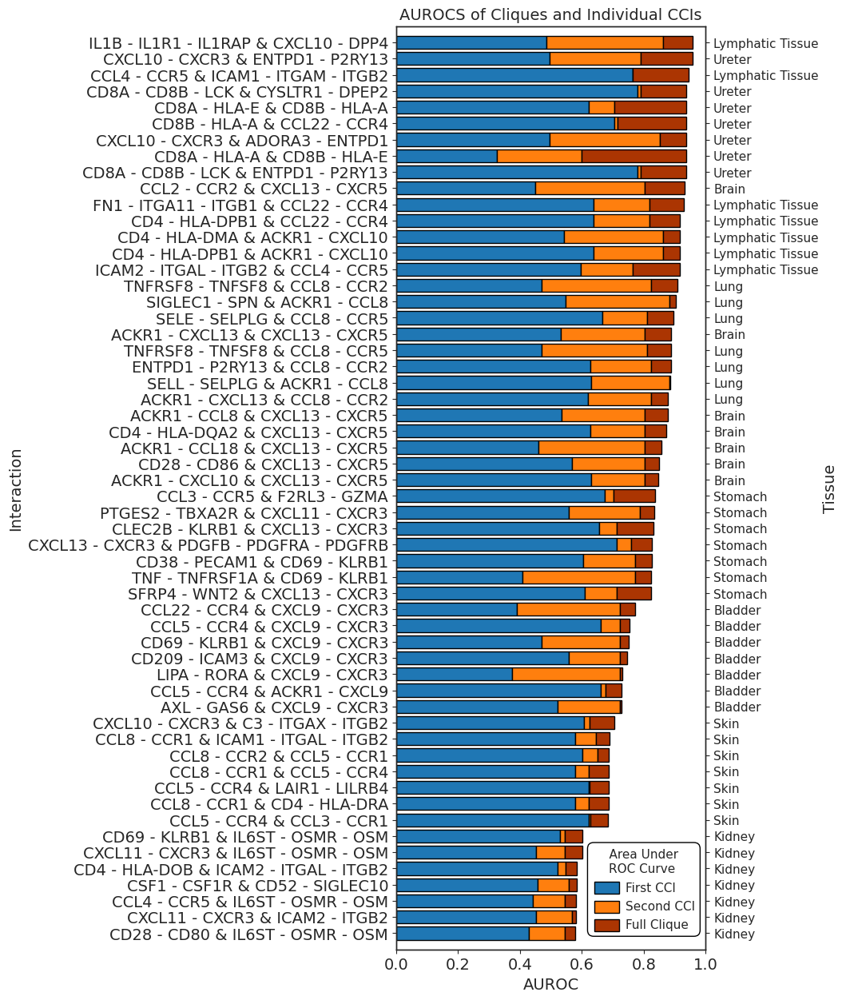

In [164]:
fs = 14
smallfs = 11

fig, ax = plt.subplots(1, 1, figsize=(5, 15))

# Sort and prepare data
barplotdf = barplotdf.sort_values(by='auroc', ascending=True)
y_pos = np.arange(len(barplotdf))

height = 0.8

# Plotting the bar segments
for j, (i, row) in enumerate(barplotdf.iterrows()):
    ypos = y_pos[j]

    auroc1 = row['auroc1']
    auroc2 = row['auroc2']
    auroc = row['auroc']

    # First segment
    if auroc1 != 0:
        ax.barh(ypos, auroc1, color='C0', height=height, edgecolor='k', linewidth=1)

    left2 = auroc1
    width2 = auroc2 - auroc1
    ax.barh(ypos, width2, left=left2, color='C1', height=height, edgecolor='k', linewidth=1)

    # Third segment
    width3 = auroc - auroc2
    if width3 != 0:
        ax.barh(ypos, width3, left=auroc2, color=tcolor, height=height, edgecolor='k', linewidth=1)

# Main Y-axis (interaction labels)
ax.set_yticks(y_pos)
ax.set_yticklabels(barplotdf['interaction'], fontsize=fs)
ax.invert_yaxis()
ax.set_xlabel('AUROC', fontsize=fs)
ax.set_ylabel('Interaction', fontsize=fs)
ax.set_ylim(-1, len(barplotdf))
ax.tick_params(axis='x', labelsize=fs)
ax.set_xlim(0, 1)

# Twin Y-axis for tissue labels
ax_twin = ax.twinx()
ax_twin.set_yticks(y_pos)
ax_twin.set_yticklabels(barplotdf['tissue'], fontsize=smallfs)
ax_twin.invert_yaxis()
ax_twin.set_ylim(-1, len(barplotdf))
ax_twin.tick_params(axis='y', labelsize=smallfs)
ax_twin.set_ylabel('Tissue', fontsize=fs)


## Horizontal line to separate negative/positive
#N_neg = sum(barplotdf['log2_hr'] < 0)
#ax.axhline(N_neg - 0.5, color='black', linewidth=2, linestyle='-')
#
## Color y-axis labels
#y_labels = ax.get_yticklabels()
#for i, label in enumerate(y_labels):
#    label.set_color(ncolor if i < N_neg else tcolor)
#
## Symmetric x-axis limits
#xlim1, xlim2 = ax.get_xlim()
#xlim = max(np.abs(xlim1), np.abs(xlim2))
##ax.set_xlim(-xlim, xlim)

# Plot title
ax.set_title('AUROCS of Cliques and Individual CCIs', fontsize=fs)

# Labels
props = dict(boxstyle='round,pad=0.5', facecolor='none', edgecolor='black', linewidth=1)
ax.text(0.8, 0.065, '    Area Under    \nROC Curve \n\n\n\n', ha='center', va='center', fontsize=smallfs, transform=ax.transAxes, bbox=props)

# Legend for high expression box
legend_x, legend_y = 0.64, 0.06
width, height = 0.08, 0.013
ax.add_patch(patches.Rectangle((legend_x, legend_y), width, height, transform=ax.transAxes,
                               facecolor='C0', edgecolor='k'))
ax.text(legend_x + width + 0.02, legend_y + height/2, 'First CCI', transform=ax.transAxes,
        va='center', fontsize=smallfs)

legend_y -= 0.02
ax.add_patch(patches.Rectangle((legend_x, legend_y), width, height, transform=ax.transAxes,
                               facecolor='C1', edgecolor='k'))
ax.text(legend_x + width + 0.02, legend_y + height/2, 'Second CCI', transform=ax.transAxes,
        va='center', fontsize=smallfs)

legend_y -= 0.02
color = tcolor  # or ncolor if you want to differentiate
ax.add_patch(patches.Rectangle((legend_x, legend_y), width, height, transform=ax.transAxes,
                               facecolor=color, edgecolor='k'))
ax.text(legend_x + width + 0.02, legend_y + height/2, 'Full Clique', transform=ax.transAxes,
        va='center', fontsize=smallfs)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)

plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/auroc_barplot.pdf', bbox_inches='tight', dpi=300)
plt.savefig('/home/lnemati/pathway_crosstalk/results/figures/immunotherapy/auroc_barplot.png', bbox_inches='tight', dpi=300)

plt.show()


In [20]:
full_dataset = pd.read_csv('/home/lnemati/pathway_crosstalk/data/immunotherapy/cohorts/full_dataset.csv')

In [23]:
full_dataset['response_NR'].value_counts()

response_NR
N    888
R    358
Name: count, dtype: int64

In [24]:
888 / 1246

0.7126805778491172

In [18]:
len(genes_subset)

56270